In [2]:
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import numpy as np
import matplotlib.animation as animation

In [3]:
plt.rc("font", family="STIXGeneral", size=9)
plt.rc("figure", dpi=300)
plt.rc("savefig", dpi=300, bbox="tight", pad_inches=0.1, transparent=True, format="pdf")
plt.rc("figure", figsize=(5.3, 2.4))
plt.rc("mathtext", fontset="stix")

In [90]:
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import imageio.v2 as imageio
import os
import numpy as np
from io import BytesIO
from PIL import Image


# Use serif font
mpl.rcParams["font.family"] = "serif"

# Load dataset

ds4 = xr.open_dataset("../data/outputs/2-D/khwala_full_B_1_ls_001_hₛ_1/hₛ_ratio=1.0.nc")
ds8 = xr.open_dataset("../data/outputs/2-D/khwala_full_B_1_ls_01_hₛ_1/hₛ_ratio=1.0.nc")


# Ensure 't' is integer-like
times = range(0, 601, 10)

# Create the GIF
with imageio.get_writer("2Dmovie_B_1_ls_01&001_hₛ_1_hₛ_ratio=1.gif", mode='I', duration=0.05) as writer:
    for t in times:
        fig, ax = plt.subplots()
        ds4.h.sel(t=t).plot(ax=ax)
        ds8.h.sel(t=t).plot(ax=ax)
    
        plt.ylabel('h')
        plt.xlabel('x')
        plt.legend()
        sns.despine()

        # Save plot to an in-memory buffer
        buf = BytesIO()
        plt.savefig(buf, format='png', bbox_inches='tight')
        buf.seek(0)


        # Convert to RGBA image (with transparency)
        img = Image.open(buf).convert("RGBA")

        # Create white background
        white_bg = Image.new("RGBA", img.size, (255, 255, 255, 255))  # white, opaque
        composite = Image.alpha_composite(white_bg, img).convert("RGB")  # flatten to RGB

        # Convert to array and add to gif
        writer.append_data(np.array(composite))

        # Cleanup
        plt.close(fig)
        buf.close()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

In [100]:
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import imageio.v2 as imageio
import os

# Use serif font
mpl.rcParams["font.family"] = "serif"

# Load dataset
ds = xr.open_dataset("../data/outputs/3-D/khwala_full_B_1_ls_002_smallermesh/hₛ=0.02.nc")

# Ensure 't' is integer-like
times = range(0, 601,10)

# Create folder to store frames
os.makedirs("frames1", exist_ok=True)

# Generate and save each frame
filenames = []
for t in times:
    fig, ax = plt.subplots(figsize=(5.3, 4))
    
    # Plot frame
    ds.h.sel(t=t).plot.imshow()
    ax.set_title(f"t = {t}", fontsize=10)
    ax.set_aspect("equal")
    #plt.axis([-10, 30, 0.024, 0.025])
    sns.despine()
    
    filename = f"frames1/frame_{t:03d}.png"
    plt.savefig(filename, dpi=300, bbox_inches="tight")
    filenames.append(filename)
    plt.close()

# Create the GIF
with imageio.get_writer("3Dmovie_khwala_full_B_1_ls_002_hₛ_02_hsratio_1.gif", mode='I', duration=0.05) as writer:
    
    for filename in filenames:
        image = imageio.mimread(filename)
        writer.append_data(image)        
        

GIF saved as '3Dmovie_khwala_full_B_1_ls_0.002_hₛ_0.02_hsratio_2.gif'.


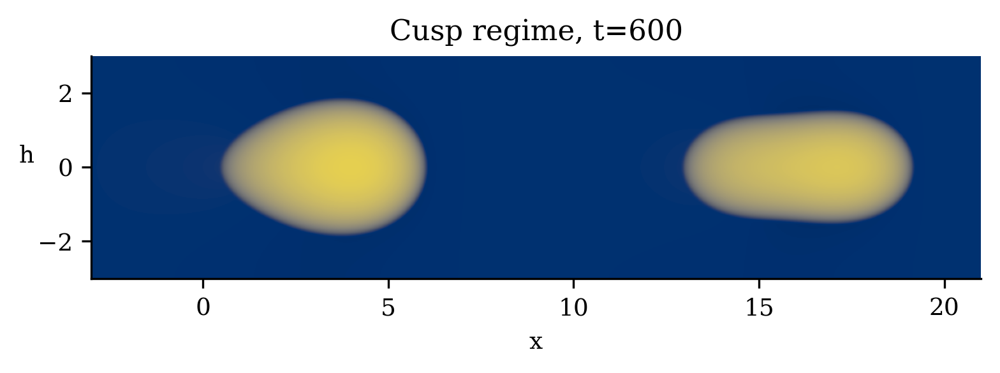

In [121]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from matplotlib.colors import PowerNorm
import matplotlib as mpl
import seaborn as sns

# Load dataset
ds = xr.open_dataset("../data/outputs/3-D/khwala_full_B_1_ls_002_smallermesh/hₛ=0.02.nc")

# Use serif font
mpl.rcParams['font.family'] = 'serif'

# Time steps
time_steps = np.arange(0, 601, 10)

# Create figure
fig, ax = plt.subplots(figsize=(6, 5))
norm = PowerNorm(0.3)
cmap = "cividis"

# Initial frame
img = ds.h.sel(t=0).plot.imshow(
    ax=ax,
    cmap=cmap,
    norm=norm,
    interpolation="antialiased",
    add_colorbar=False
)

# Format axes
ax.set_aspect("equal")
ax.set_title("Cusp regime")
ax.set_xlabel("x")
ax.set_ylabel("h",rotation=0)
sns.despine(ax=ax)

# Update function for animation
def update(frame_idx):
    t_val = time_steps[frame_idx]
    h_frame = ds.h.sel(t=t_val)
    img.set_array(h_frame.values)
    ax.set_title(f"Cusp regime, t={t_val}")
    return [img]

# Create animation
ani = FuncAnimation(
    fig, update, frames=len(time_steps), blit=True, interval=400, repeat=True
)

# Save as GIF (for use in VS Code and web)
ani.save("3Dmovie_khwala_full_B_1_ls_0.002_hₛ_0.02_hsratio_2_2.gif", writer=PillowWriter(fps=5))
print("GIF saved as '3Dmovie_khwala_full_B_1_ls_0.002_hₛ_0.02_hsratio_2.gif'.")

# Show final frame (optional)
plt.show()

KeyError: "not all values found in index 't'. Try setting the `method` keyword argument (example: method='nearest')."

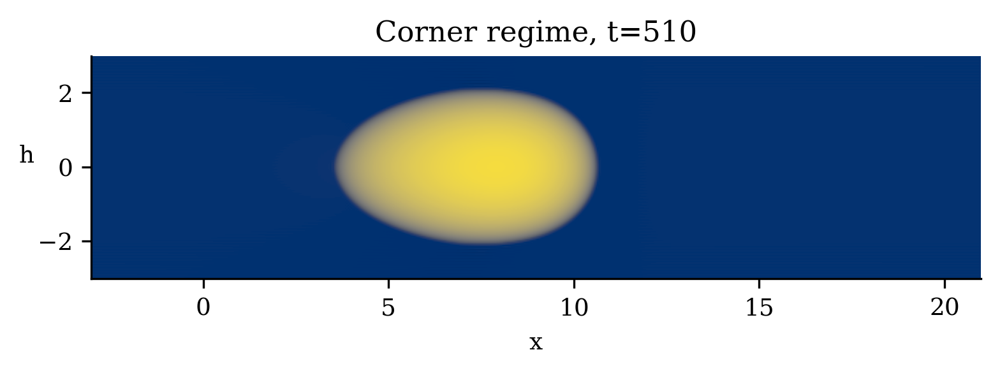

In [123]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from matplotlib.colors import PowerNorm
import matplotlib as mpl
import seaborn as sns

# Load dataset
ds = xr.open_dataset("../data/outputs/3-D/khwala_full_B_0.5_ls_002_hₛ_02/hₛ_ratio=1.0.nc")

# Use serif font
mpl.rcParams['font.family'] = 'serif'

# Time steps
time_steps = np.arange(0, 601, 10)

# Create figure
fig, ax = plt.subplots(figsize=(6, 5))
norm = PowerNorm(0.3)
cmap = "cividis"

# Initial frame
img = ds.h.sel(t=0).plot.imshow(
    ax=ax,
    cmap=cmap,
    norm=norm,
    interpolation="antialiased",
    add_colorbar=False
)

# Format axes
ax.set_aspect("equal")
ax.set_title("Corner regime")
ax.set_xlabel("x")
ax.set_ylabel("h",rotation=0)
sns.despine(ax=ax)

# Update function for animation
def update(frame_idx):
    t_val = time_steps[frame_idx]
    h_frame = ds.h.sel(t=t_val)
    img.set_array(h_frame.values)
    ax.set_title(f"Corner regime, t={t_val}")
    return [img]

# Create animation
ani = FuncAnimation(
    fig, update, frames=len(time_steps), blit=True, interval=400, repeat=True
)

# Save as GIF (for use in VS Code and web)
ani.save("3Dmovie_khwala_full_B_0.5_ls_002_hₛ_02_hsratio_1.gif", writer=PillowWriter(fps=2))
print("GIF saved as '3Dmovie_khwala_full_B_0.5_ls_002_hₛ_02_hsratio_1.gif'.")

# Show final frame (optional)
plt.show()

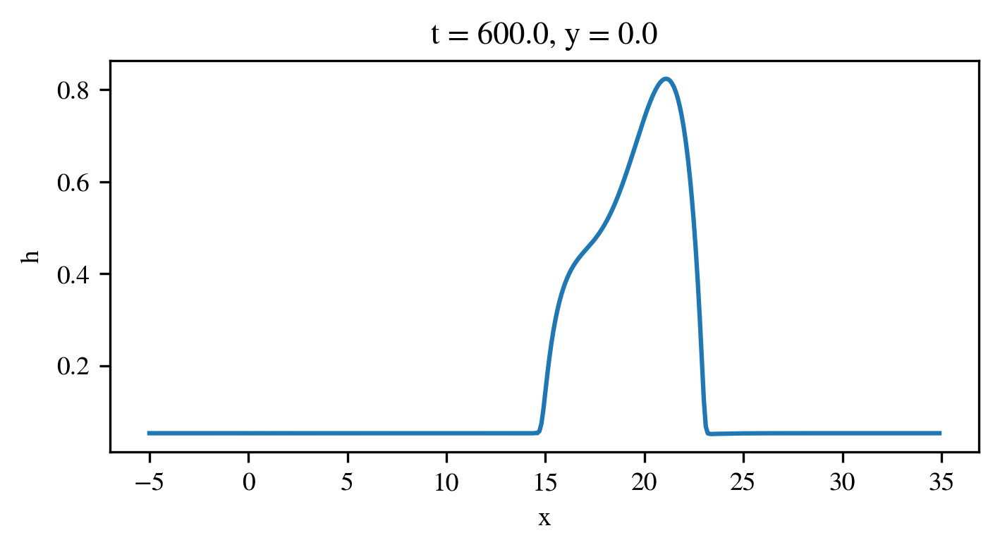

In [3]:
#fig, axs = plt.subplots(
   # 5, 2, figsize=(16, 16), sharex=True, sharey=True, constrained_layout=True
#)
#ds4 = xr.open_dataset("../data/outputs/3-D/transverseviscous1/hₛ=0.1.nc")
ds4 = xr.open_dataset("../data/outputs/2-D/khwala_10cst_B_1_full/hₛ=0.05.nc")
#ds8 = xr.open_dataset("../data/outputs/3-D/test4/hₛ=0.1.nc")
#ds9 = xr.open_dataset("../data/outputs/test/transverseviscous1/hₛ=0.1.nc")
#plt.axis([-10, 30, 0.024, 0.025])
#(ds4["h"].sel(t=0)).plot()
(ds4["h"].sel(t=600)).plot()
#(ds4["h"].sel(t=330)).plot()
#(ds4["h"].sel(t=600)).plot()

[Text(794.3603219696969, 0.5, ''),
 Text(794.3603219696969, 0.5, ''),
 Text(794.3603219696969, 0.5, ''),
 Text(794.3603219696969, 0.5, ''),
 Text(794.3603219696969, 0.5, ''),
 Text(794.3603219696969, 0.5, ''),
 Text(794.3603219696969, 0.5, ''),
 Text(794.3603219696969, 0.5, ''),
 Text(794.3603219696969, 0.5, ''),
 Text(794.3603219696969, 0.5, ''),
 Text(794.3603219696969, 0.5, '')]

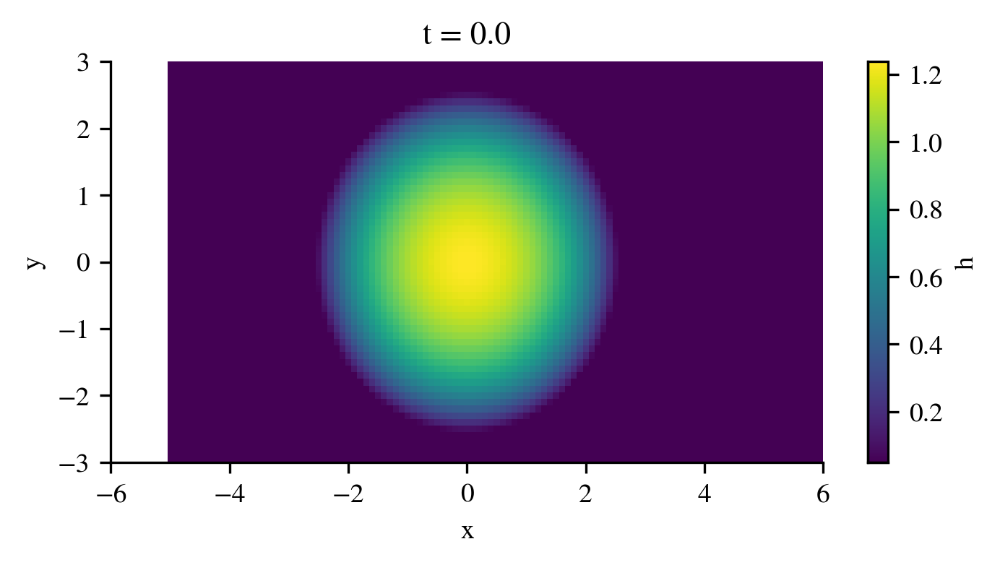

In [23]:
# fig 04
ds = xr.open_dataset("../data/outputs/3-D/khwala_10cst_B_1_full_ls_0005/hₛ=0.05.nc")
# use serif
#fig, axs = plt.subplots(1, 1, figsize=(5.3, 9.4), sharex=True, sharey=True)
#for ax, t in zip(axs.flat, [0, 60, 150, 300, 600, 900, 1050, 1200, 1500, 1800, 2400, 3600, 4800, 6000]):
(ds["h"].sel(t=0)).plot()  
plt.axis([-6, 6, -3, 3])
ax.set_aspect("equal")
sns.despine()
[ax.set_xlabel("") for ax in axs[0, :]]
[ax.set_ylabel("") for ax in axs[:, -1]]

In [9]:
# fig 04
ds = xr.open_dataset("../dhₛ=0.05.ncata/outputs/3-D/symetrynicolasls_001_mu_005/")
# use serif
fig, axs = plt.subplots(8, 2, figsize=(5.3, 9.4), sharex=True, sharey=True)
for ax, t in zip(axs.flat, [0, 60, 150, 300, 600, 900, 1050, 1200, 1500, 1800, 2400, 3000]):
    ds.h.sel(t=t).plot.imshow(
        cmap="cividis",
        interpolation="antialiased",
        add_colorbar=False,
        norm=plt.matplotlib.colors.PowerNorm(0.3),
        ax=ax,
    )     

    ax.set_aspect("equal")
    sns.despine()
[ax.set_xlabel("") for ax in axs[0, :]]
[ax.set_ylabel("") for ax in axs[:, -1]]

ValueError: did not find a match in any of xarray's currently installed IO backends ['scipy']. Consider explicitly selecting one of the installed engines via the ``engine`` parameter, or installing additional IO dependencies, see:
https://docs.xarray.dev/en/stable/getting-started-guide/installing.html
https://docs.xarray.dev/en/stable/user-guide/io.html

In [19]:
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns

# Load dataset (make sure file exists at this path)
ds = xr.open_dataset("../data/outputs/2-D/khwala_10cst_B_1_full/hₛ=0.05.nc")

# Use serif fonts globally (optional)
plt.rcParams["font.family"] = "serif"

# Create plot layout
fig, axs = plt.subplots(4, 2, figsize=(5.3, 8), sharex=True, sharey=True)

# Time points to visualize
time_points = [0, 30, 60, 90, 120, 150, 180, 210]

# Loop over axes and times
for ax, t in zip(axs.flat, time_points):
    # Use 'nearest' to avoid errors if exact time not in dataset
    ds.h.sel(t=t, method="nearest").plot.imshow(
        cmap="cividis",
        interpolation="antialiased",
        add_colorbar=False,
        norm=mcolors.PowerNorm(0.3),
        ax=ax,
    )

    ax.set_title(f"t = {t}", fontsize=8)
    ax.set_aspect("equal")
    sns.despine(ax=ax)

# Remove x-axis labels for top rows, y-axis for right column
for ax in axs[:-1, :].flat:
    ax.set_xlabel("")
for ax in axs[:, 1].flat:
    ax.set_ylabel("")

plt.tight_layout()
plt.show()

ValueError: found the following matches with the input file in xarray's IO backends: ['netcdf4', 'h5netcdf']. But their dependencies may not be installed, see:
https://docs.xarray.dev/en/stable/user-guide/io.html 
https://docs.xarray.dev/en/stable/getting-started-guide/installing.html

[Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, '')]

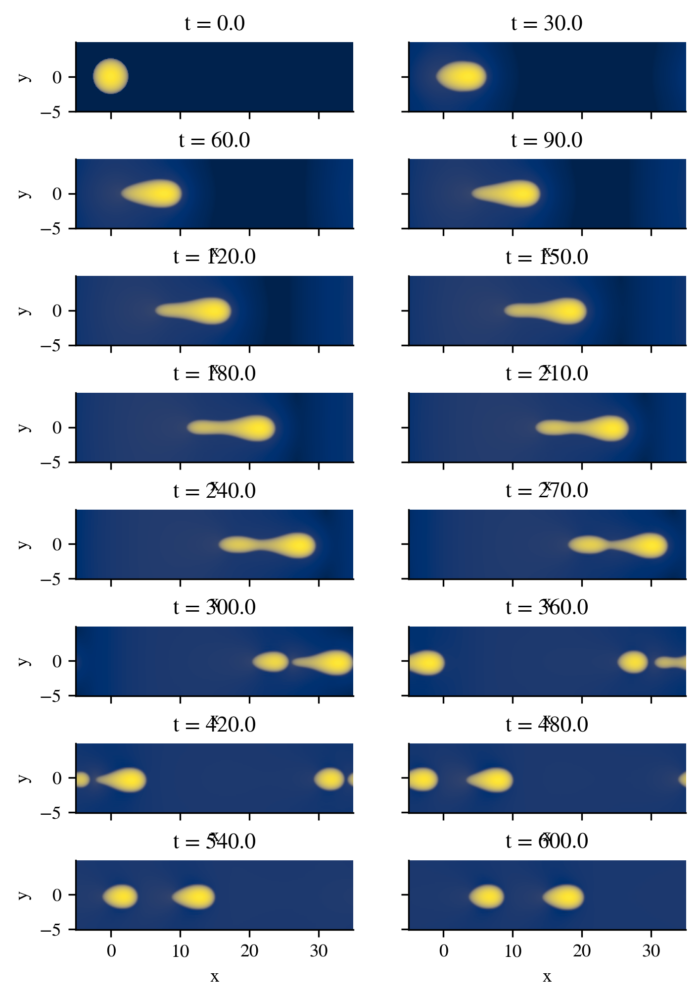

In [6]:
#Oval regime_comparison with experiments at Bond  number=0.1 and 5 defree hystersis. (50.5 and 40.5 degree contact angle). Inclination angle =9 degree
ds = xr.open_dataset("../data/outputs/3-D/khwala_10cst_B_1_full/hₛ=0.05.nc")
# use serif
fig, axs = plt.subplots(8, 2, figsize=(5.3, 8), sharex=True, sharey=True)
for ax, t in zip(axs.flat, [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 360, 420, 480, 540, 600]):
    ds.h.sel(t=t).plot.imshow(
        cmap="cividis",
        interpolation="antialiased",
        add_colorbar=False,
        norm=plt.matplotlib.colors.PowerNorm(0.3),
        ax=ax,
    )     

    ax.set_aspect("equal")
    sns.despine()
[ax.set_xlabel("") for ax in axs[0, :]]
[ax.set_ylabel("") for ax in axs[:, -1]]

In [ ]:
#Oval regime_comparison with experiments at Bond  number=0.25 and 5 defree hystersis. (50.5 and 40.5 degree contact angle). Inclination angle =9 degree
ds = xr.open_dataset("../data/outputs/3-D/khwala_10cst_B_1/hₛ=0.05.nc")
# use serif
fig, axs = plt.subplots(5, 2, figsize=(5.3, 8), sharex=True, sharey=True)
for ax, t in zip(axs.flat, [0, 30, 60, 90, 120, 150, 180, 210, 240]):
    ds.h.sel(t=t).plot.imshow(
        cmap="cividis",
        interpolation="antialiased",
        add_colorbar=False,
        norm=plt.matplotlib.colors.PowerNorm(0.3),
        ax=ax,
    )     

    ax.set_aspect("equal")
    sns.despine()
[ax.set_xlabel("") for ax in axs[0, :]]
[ax.set_ylabel("") for ax in axs[:, -1]]

FileNotFoundError: [Errno 2] No such file or directory: '/home/igin/Documents/Julia/WRM/data/outputs/3-D/khwala_10cst_B_1/hₛ=0.05.nc'

[Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, '')]

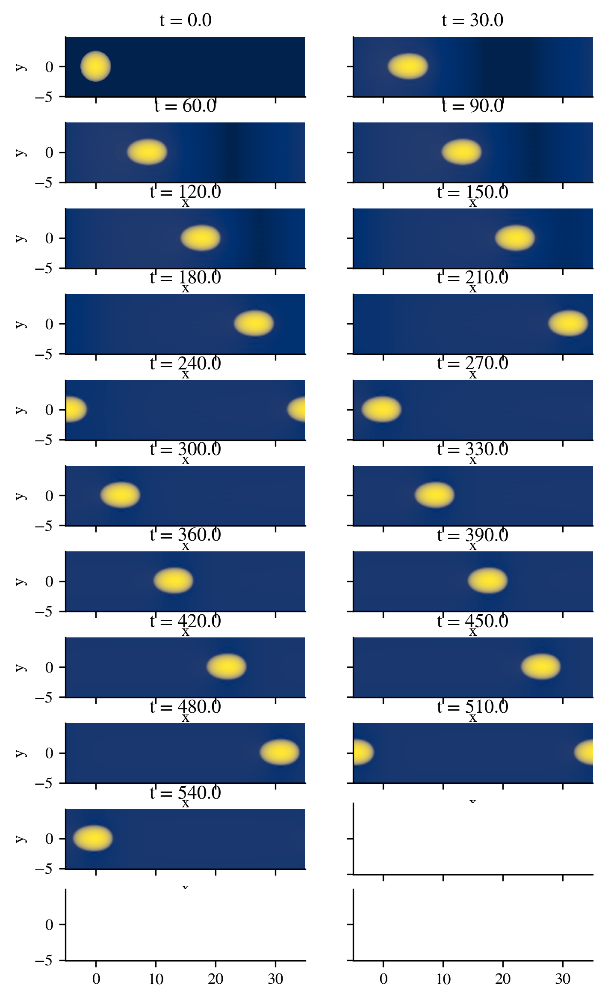

In [ ]:
#Oval regime_comparison with experiments at Bond  number=0.25. Inclination angle =9 degree
ds = xr.open_dataset("../data/outputs/3-D/khwala_10cst_B_0.25/hₛ=0.05.nc")
# use serif
fig, axs = plt.subplots(11, 2, figsize=(5.3, 9.4), sharex=True, sharey=True)
for ax, t in zip(axs.flat, [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 510, 540]):
    ds.h.sel(t=t).plot.imshow(
        cmap="cividis",
        interpolation="antialiased",
        add_colorbar=False,
        norm=plt.matplotlib.colors.PowerNorm(0.3),
        ax=ax,
    )     

    ax.set_aspect("equal")
    sns.despine()
[ax.set_xlabel("") for ax in axs[0, :]]
[ax.set_ylabel("") for ax in axs[:, -1]]

[Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, '')]

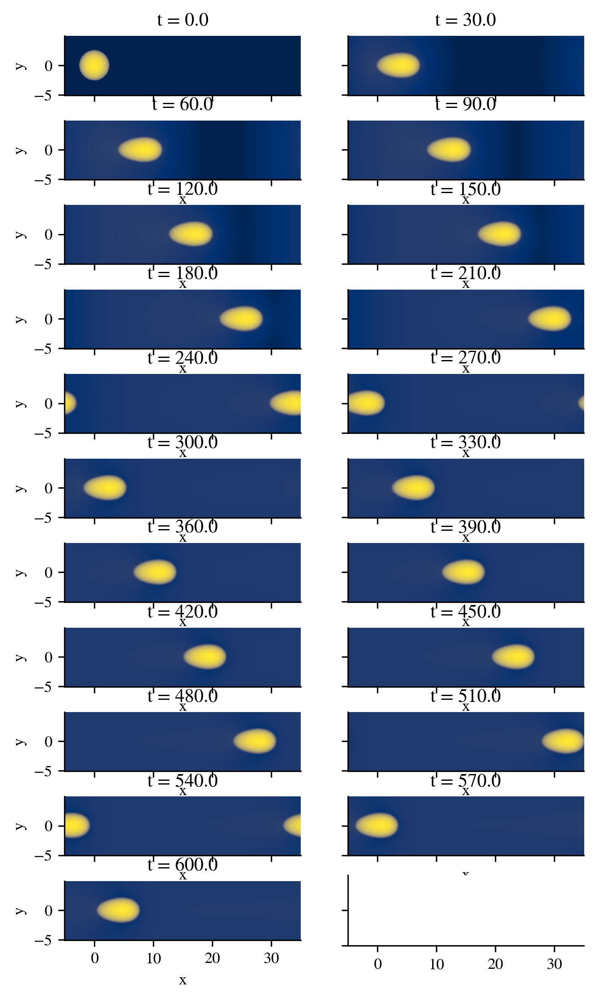

In [ ]:
#Corner regime_comparison with experiments at Bond  number=0.5. Inclination angle =19 degree
ds = xr.open_dataset("../data/outputs/3-D/khwala_10cst_B_0.5/hₛ=0.05.nc")
# use serif
fig, axs = plt.subplots(11, 2, figsize=(5.3, 9.4), sharex=True, sharey=True)
for ax, t in zip(axs.flat, [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 510, 540, 570, 600]):
    ds.h.sel(t=t).plot.imshow(
        cmap="cividis",
        interpolation="antialiased",
        add_colorbar=False,
        norm=plt.matplotlib.colors.PowerNorm(0.3),
        ax=ax,
    )     

    ax.set_aspect("equal")
    sns.despine()
[ax.set_xlabel("") for ax in axs[0, :]]
[ax.set_ylabel("") for ax in axs[:, -1]]

[Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, '')]

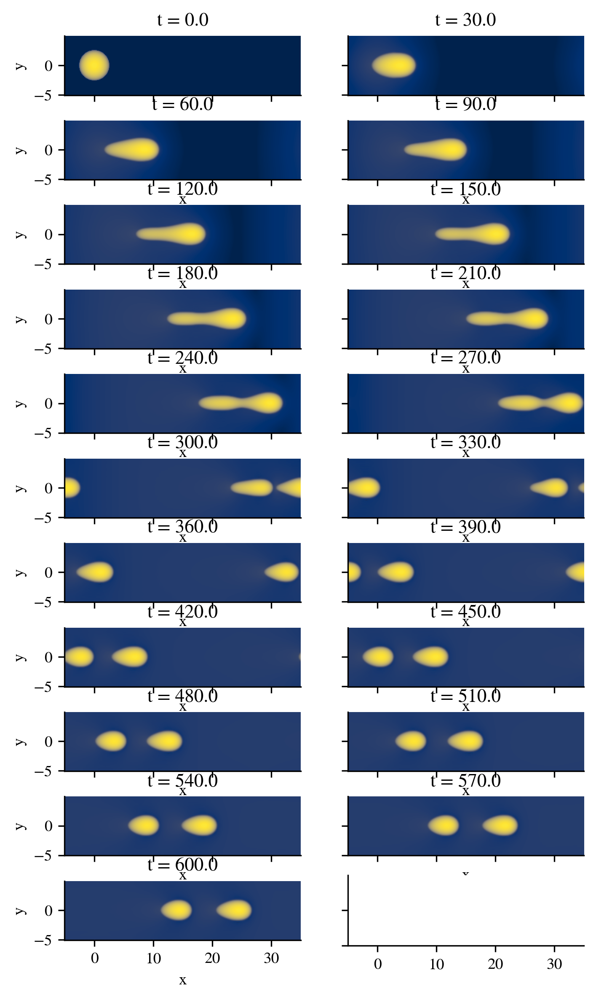

In [ ]:
#Cusp regime_comparison with experiments at Bond  number=1. Inclination angle =41 degree
ds = xr.open_dataset("../data/outputs/3-D/khwala_10cst_B_1/hₛ=0.05.nc")
# use serif
fig, axs = plt.subplots(11, 2, figsize=(5.3, 9.4), sharex=True, sharey=True)
for ax, t in zip(axs.flat, [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 510, 540, 570, 600]):
    ds.h.sel(t=t).plot.imshow(
        cmap="cividis",
        interpolation="antialiased",
        add_colorbar=False,
        norm=plt.matplotlib.colors.PowerNorm(0.3),
        ax=ax,
    )     

    ax.set_aspect("equal")
    sns.despine()
[ax.set_xlabel("") for ax in axs[0, :]]
[ax.set_ylabel("") for ax in axs[:, -1]]

[Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, '')]

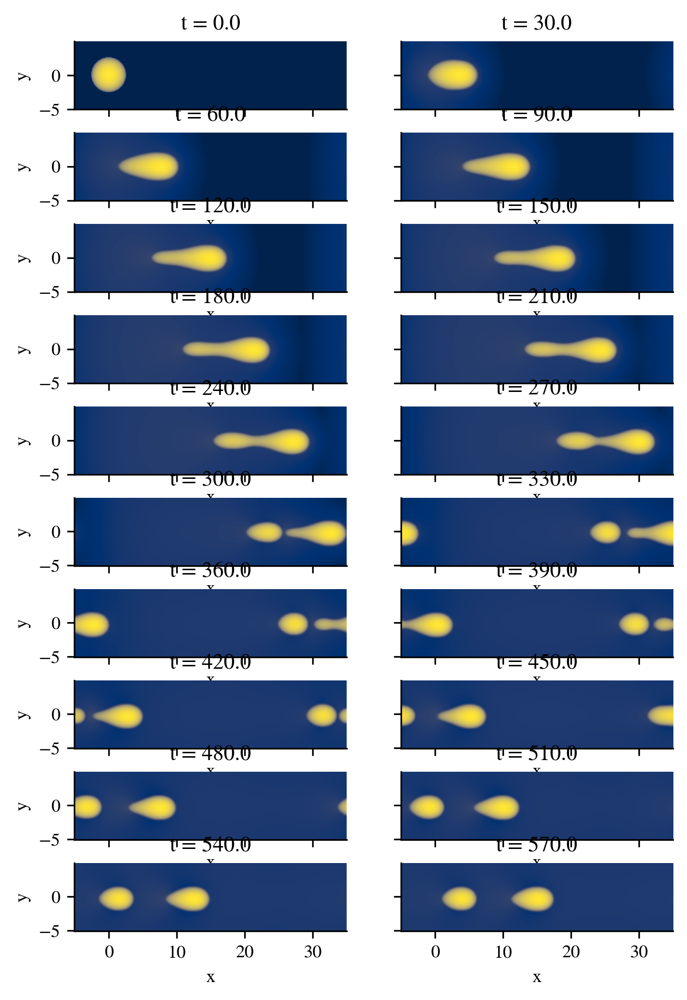

In [12]:
#Oval regime_comparison with experiments at Bond  number=0.1 and 5 defree hystersis. (50.5 and 40.5 degree contact angle). Inclination angle =9 degree
ds = xr.open_dataset("../data/outputs/3-D/khwala_10cst_B_1_full_ls_0005/hₛ=0.05.nc")
# use serif
fig, axs = plt.subplots(10, 2, figsize=(5.3, 8), sharex=True, sharey=True)
for ax, t in zip(axs.flat, [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 510, 540, 570, 600]):
    ds.h.sel(t=t).plot.imshow(
        cmap="cividis",
        interpolation="antialiased",
        add_colorbar=False,
        norm=plt.matplotlib.colors.PowerNorm(0.3),
        ax=ax,
    )     

    ax.set_aspect("equal")
    sns.despine()
[ax.set_xlabel("") for ax in axs[0, :]]
[ax.set_ylabel("") for ax in axs[:, -1]]

[Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, '')]

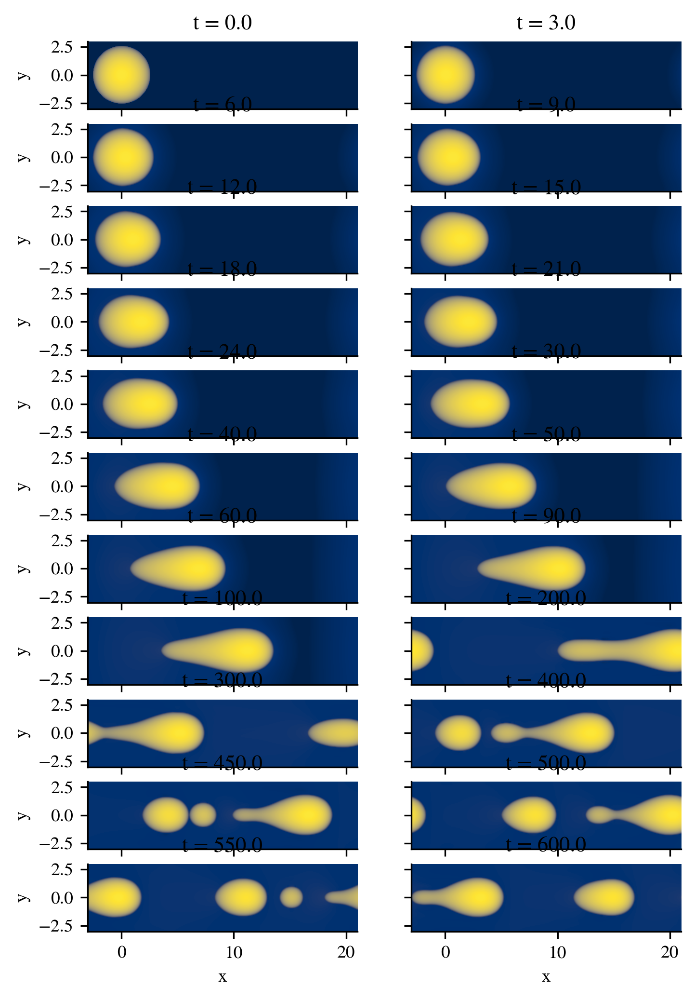

In [33]:
#Oval regime_comparison with experiments at Bond  number=0.1 and 5; defree hystersis. (50.5 and 40.5 degree contact angle). Inclination angle =9 degree
ds = xr.open_dataset("../data/outputs/3-D/khwala_full_B_1_ls_001_1/hₛ=0.02.nc")
# use serif
fig, axs = plt.subplots(11, 2, figsize=(5.3, 8), sharex=True, sharey=True)
for ax, t in zip(axs.flat, [0, 3, 6, 9, 12, 15, 18, 21, 24, 30, 40, 50, 60, 90, 100, 200, 300, 400, 450, 500, 550, 600]):
    ds.h.sel(t=t).plot.imshow(
        cmap="cividis",
        interpolation="antialiased",
        add_colorbar=False,
        norm=plt.matplotlib.colors.PowerNorm(0.3),
        ax=ax,
    )     

    ax.set_aspect("equal")
    sns.despine()
[ax.set_xlabel("") for ax in axs[0, :]]
[ax.set_ylabel("") for ax in axs[:, -1]]

[Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, '')]

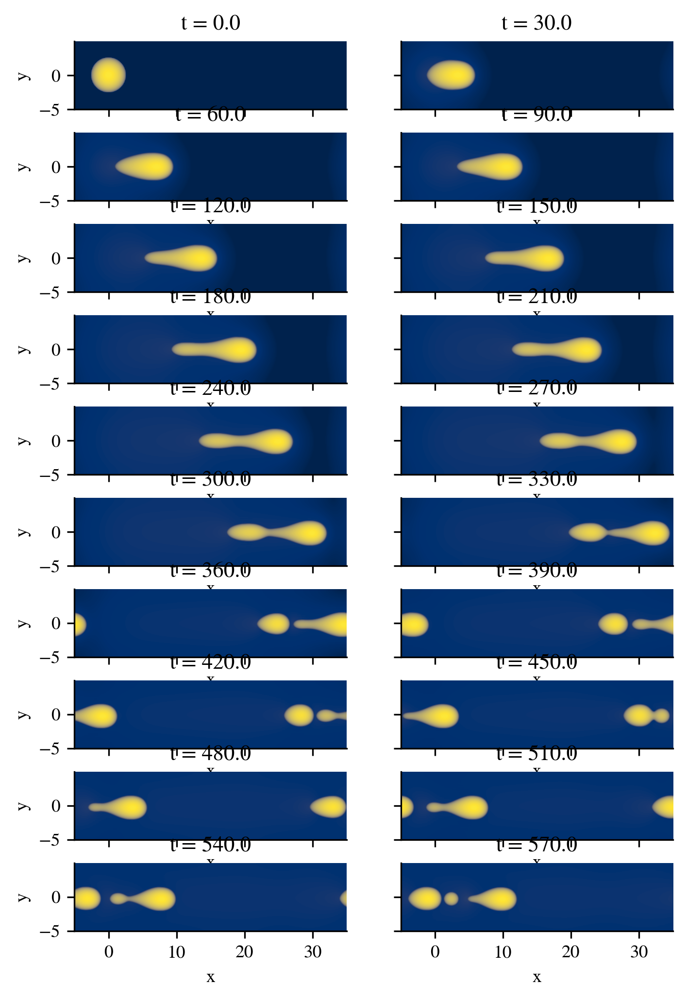

In [5]:
#Oval regime_comparison with experiments at Bond  number=0.1 and 5 defree hystersis. (50.5 and 40.5 degree contact angle). Inclination angle =9 degree
ds = xr.open_dataset("../data/outputs/3-D/khwala_10cst_B_1_full_ls_001_hs_025/hₛ=0.025.nc")
# use serif
fig, axs = plt.subplots(10, 2, figsize=(5.3, 8), sharex=True, sharey=True)
for ax, t in zip(axs.flat, [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 510, 540, 570, 600]):
    ds.h.sel(t=t).plot.imshow(
        cmap="cividis",
        interpolation="antialiased",
        add_colorbar=False,
        norm=plt.matplotlib.colors.PowerNorm(0.3),
        ax=ax,
    )     

    ax.set_aspect("equal")
    sns.despine()
[ax.set_xlabel("") for ax in axs[0, :]]
[ax.set_ylabel("") for ax in axs[:, -1]]

[Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, '')]

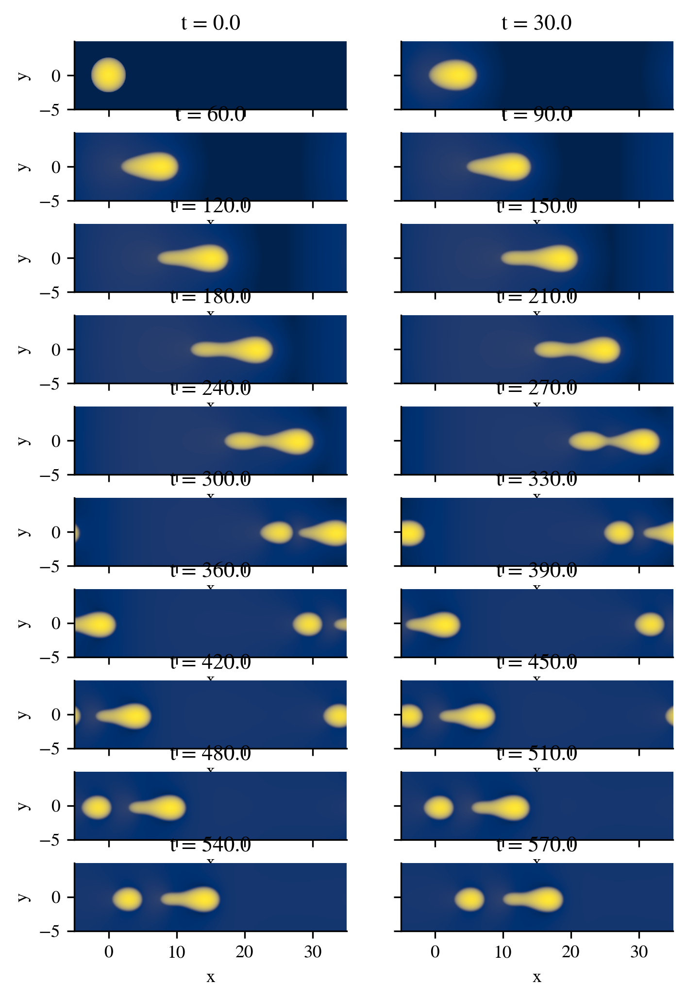

In [13]:
#Oval regime_comparison with experiments at Bond  number=0.1 and 5 defree hystersis. (50.5 and 40.5 degree contact angle). Inclination angle =9 degree
ds = xr.open_dataset("../data/outputs/3-D/khwala_10cst_B_1_full_ls_001_smallermesh/hₛ=0.05.nc")
# use serif
fig, axs = plt.subplots(10, 2, figsize=(5.3, 8), sharex=True, sharey=True)
for ax, t in zip(axs.flat, [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 510, 540, 570, 600]):
    ds.h.sel(t=t).plot.imshow(
        cmap="cividis",
        interpolation="antialiased",
        add_colorbar=False,
        norm=plt.matplotlib.colors.PowerNorm(0.3),
        ax=ax,
    )     

    ax.set_aspect("equal")
    sns.despine()
[ax.set_xlabel("") for ax in axs[0, :]]
[ax.set_ylabel("") for ax in axs[:, -1]]

[Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, '')]

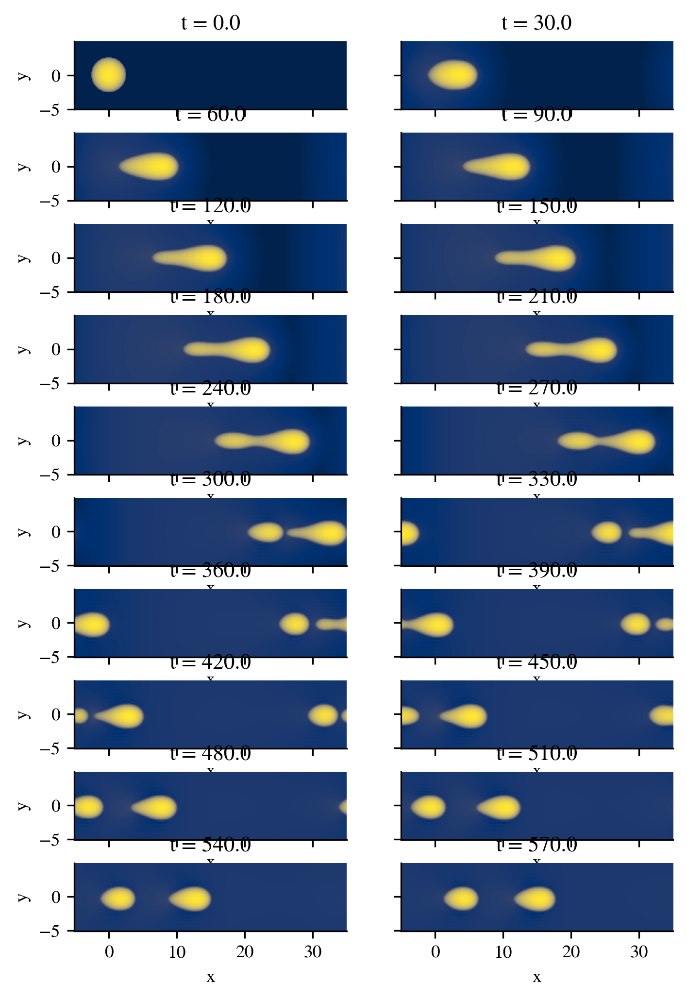

In [11]:
#Oval regime_comparison with experiments at Bond  number=0.1 and 5 defree hystersis. (50.5 and 40.5 degree contact angle). Inclination angle =9 degree
ds = xr.open_dataset("../data/outputs/3-D/khwala_10cst_B_1_full/hₛ=0.05.nc")
# use serif
fig, axs = plt.subplots(10, 2, figsize=(5.3, 8), sharex=True, sharey=True)
for ax, t in zip(axs.flat, [0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450, 480, 510, 540, 570, 600]):
    ds.h.sel(t=t).plot.imshow(
        cmap="cividis",
        interpolation="antialiased",
        add_colorbar=False,
        norm=plt.matplotlib.colors.PowerNorm(0.3),
        ax=ax,
    )     

    ax.set_aspect("equal")
    sns.despine()
[ax.set_xlabel("") for ax in axs[0, :]]
[ax.set_ylabel("") for ax in axs[:, -1]]

[Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, '')]

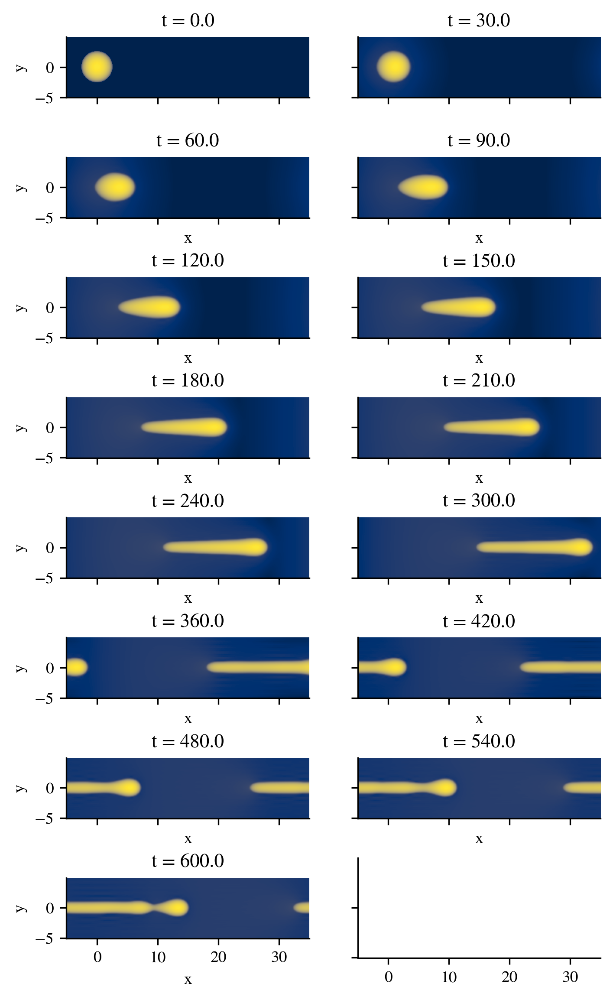

In [210]:
# fig 04
ds = xr.open_dataset("../data/outputs/3-D/symetrykhwala_propogationspeed_1/hₛ=0.05.nc")
# use serif
fig, axs = plt.subplots(8, 2, figsize=(5.3, 9.4), sharex=True, sharey=True)
for ax, t in zip(axs.flat, [0, 30, 60, 90, 120, 150, 180, 210, 240, 300, 360, 420, 480, 540, 600]):
    ds.h.sel(t=t).plot.imshow(
        cmap="cividis",
        interpolation="antialiased",
        add_colorbar=False,
        norm=plt.matplotlib.colors.PowerNorm(0.3),
        ax=ax,
    )     

    ax.set_aspect("equal")
    sns.despine()
[ax.set_xlabel("") for ax in axs[0, :]]
[ax.set_ylabel("") for ax in axs[:, -1]]


In [223]:
ds = xr.open_dataset("../data/outputs/2-D/khwala/hₛ=0.05.nc")
ds1 = xr.open_dataset("../data/outputs/2-D/khwala_ls_0005/hₛ=0.05.nc")
# use serif
fig, axs = plt.subplots(6, 2, figsize=(5.3, 6.4), sharex=True, sharey=True, constrained_layout=True)
for ax, t in zip(axs.flat, [0, 60, 120, 180, 240, 300, 360, 420, 480, 540, 600]):
    ds.h.sel(t=0).plot(
        #cmap="cividis",
        #interpolation="antialiased",
        #add_colorbar=False,
        #norm=plt.matplotlib.colors.PowerNorm(0.3),
        ax=ax,
    )     
    ds.h.sel(t=t).plot(
        #cmap="cividis",
        #interpolation="antialiased",
        #add_colorbar=False,
        #norm=plt.matplotlib.colors.PowerNorm(0.3),
        ax=ax,
    )   
    ds1.h.sel(t=t).plot(
        #cmap="cividis",
        #interpolation="antialiased",
        #add_colorbar=False,
        #norm=plt.matplotlib.colors.PowerNorm(0.3),
        ax=ax,
    )  
    #ax.set_aspect("equal")
    #ax.set_xlim(-5, 25)
    #sns.despine(trim=True)
[ax.set_xlabel("") for ax in axs[:-1, :].flat]
[ax.set_ylabel("") for ax in axs[:, 1:].flat]
#fig.tight_layout()

FileNotFoundError: [Errno 2] No such file or directory: '/home/igin/Documents/Julia/WRM/data/outputs/2-D/khwala_ls_0005/hₛ=0.05.nc'

[Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, '')]

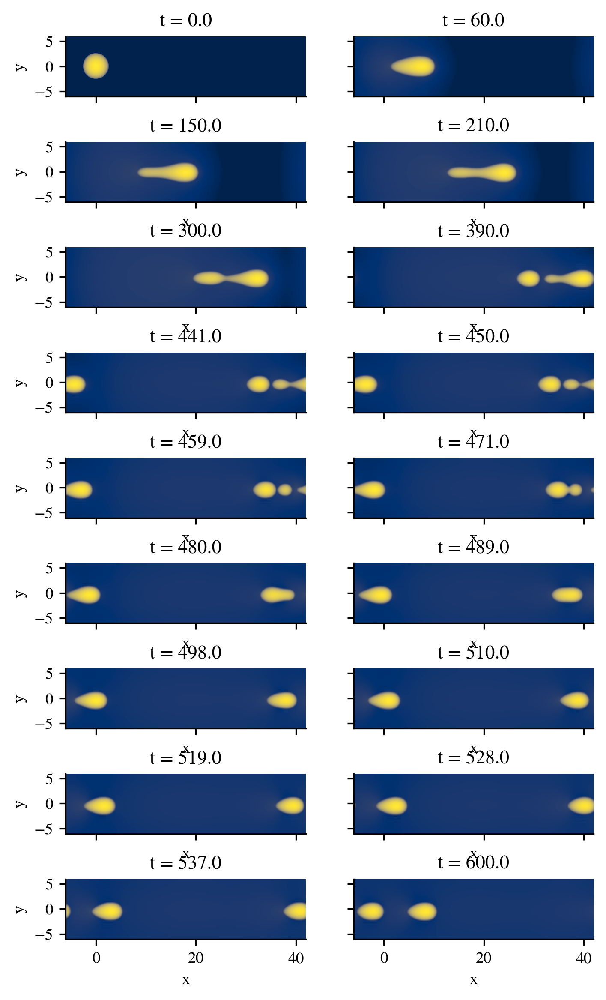

In [195]:
# fig 04
ds = xr.open_dataset("../data/outputs/3-D/test17/hₛ=0.05.nc")
# use serif
fig, axs = plt.subplots(9, 2, figsize=(5.3, 9.4), sharex=True, sharey=True)
for ax, t in zip(axs.flat, [0, 60, 150, 210, 300, 390, 441, 450, 459, 471, 480, 489, 498, 510, 519, 528, 537, 600]):
    ds.h.sel(t=t).plot.imshow(
        cmap="cividis",
        interpolation="antialiased",
        add_colorbar=False,
        norm=plt.matplotlib.colors.PowerNorm(0.3),
        ax=ax,
    )
    ax.set_aspect("equal")
    sns.despine()
[ax.set_xlabel("") for ax in axs[0, :]]
[ax.set_ylabel("") for ax in axs[:, -1]]

/home/igin/anaconda3/lib/python3.12/site-packages/matplotlib/animation.py:892: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


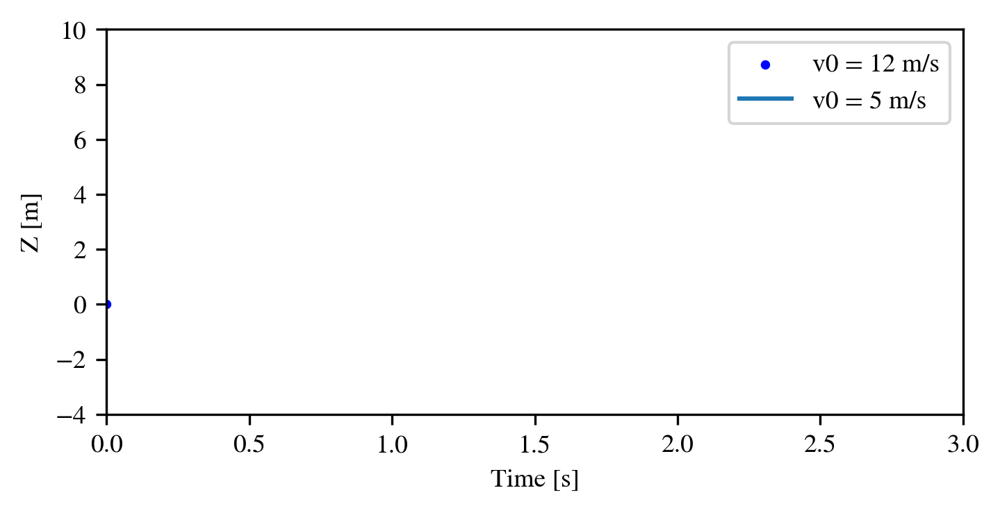

In [85]:
ds = xr.open_dataset("../data/outputs/3-D/test11/hₛ=0.1.nc")
fig, ax = plt.subplots()
t = np.linspace(0, 3, 40)
g = -9.81
v0 = 12
z = g * t**2 / 2 + v0 * t

v02 = 5
z2 = g * t**2 / 2 + v02 * t

scat = ax.scatter(t[0], z[0], c="b", s=5, label=f'v0 = {v0} m/s')
line2 = ax.plot(t[0], z2[0], label=f'v0 = {v02} m/s')[0]
ax.set(xlim=[0, 3], ylim=[-4, 10], xlabel='Time [s]', ylabel='Z [m]')
ax.legend()


def update(frame):
    # for each frame, update the data stored on each artist.
    x = t[:frame]
    y = z[:frame]
    # update the scatter plot:
    data = np.stack([x, y]).T
    scat.set_offsets(data)
    # update the line plot:
    line2.set_xdata(t[:frame])
    line2.set_ydata(z2[:frame])
    return (scat, line2)


anim = animation.FuncAnimation(fig=fig, func=update, frames=40, interval=30)
plt.show()


In [208]:
ds = xr.open_dataset("../data/outputs/trial/hₛ=0.05.nc")
ds1 = xr.open_dataset("../data/outputs/trial1/hₛ=0.05.nc")
ds2 = xr.open_dataset("../data/outputs/trial2/hₛ=0.05.nc")
ds3 = xr.open_dataset("../data/outputs/trial3/hₛ=0.05.nc")
#ds5 = xr.open_dataset("../data/outputs/trial5/hₛ=0.05.nc")
ds6 = xr.open_dataset("../data/outputs/trial6/hₛ=0.05.nc")
ds7 = xr.open_dataset("../data/outputs/trial7/hₛ=0.05.nc")
#ds5["h"].sel(t=400).plot()
#ds6["h"].sel(t=400).plot()
ds7["h"].sel(t=0).plot()
ds7["h"].sel(t=10).plot()
ds7["h"].sel(t=20).plot()
ds7["h"].sel(t=400).plot()
#ds4["h"].sel(t=400).plot()

FileNotFoundError: [Errno 2] No such file or directory: '/home/igin/Documents/Julia/WRM/data/outputs/trial7/hₛ=0.05.nc'

In [ ]:
datasets: Dict[str, Dataset] = {}
for ds in sorted(Path("../data/outputs/Different hs at hsb=0.01/").glob("hₛ*.nc")):
    ds = xr.open_dataset(ds).isel(y=0)
    datasets[ds.attrs["hₛ"]] = ds
ref = datasets[0.1].h.isel(t=-1)
ref = ref.roll(x=len(ref.x) // 2 - int(ref.argmax("x"))) - 0.1


ds = datasets[0.1]

    # n_traces = 10
    # step = len(ds.t) // n_traces
    # for i, t in enumerate(ds.t[::step]):
    #     if i == 0:
    #         continue
    #     frame = ds.h.sel(t=t)
    #     frame = frame.roll(x=len(ds.x) // 2 - int(frame.argmax("x")))
    #     frame.plot(ax=ax, color="k", alpha=(i / n_traces) * (0.8 - 0.1) + 0.1, linewidth=0.65)
frame = ds.h.isel(t=-1)
frame = frame.roll(x=len(ds.x) // 2 - int(frame.argmax("x")))
ax.hlines(
    ds.attrs["hs"] * 1.1, xmin, xmax, color="r", linestyle="--", linewidth=0.65
    )
(ref + hs).plot(ax=ax, color="red", linewidth=0.65, linestyle="--")
frame.plot(ax=ax, color="k", linewidth=0.65)
ax.set_title(rf"$h^p = {ds.attrs['hs']:.2f}$")
ax.set_xlim(-5, 25)
sns.despine(trim=True)
[ax.set_xlabel("") for ax in axs[:-1, :].flat]
[ax.set_ylabel("") for ax in axs[:, 1:].flat]

fig.tight_layout()


KeyError: 'hs'

In [55]:
# to view phi1ϕx
ds = xr.open_dataset("../data/outputs/2D_simple/dθₛ=0.nc")
fig, axs = plt.subplots(2, 2, figsize=(5.3, 2.4), sharex=True, sharey=True)
for ax, t in zip(axs.flat, [0, 1, 2, 4]):
    ds["h"].sel(t=t).plot.imshow(
        cmap="cividis",
        interpolation="antialiased",
        add_colorbar=False,
        norm=plt.matplotlib.colors.PowerNorm(0.3),
        ax=ax,
    )
    ax.set_aspect("equal")
    sns.despine()
[ax.set_xlabel("") for ax in axs[0, :]]
[ax.set_ylabel("") for ax in axs[:, -1]]

FileNotFoundError: [Errno 2] No such file or directory: '/home/igin/Documents/Julia/WRM/data/outputs/2D_simple/dθₛ=0.nc'

In [56]:
# fig 02
ds = xr.open_dataset("../data/outputs/2D_simple/dθₛ=0.nc")

fig, axs = plt.subplots(2, 2, figsize=(5.3, 2.4), sharex=True, sharey=True)
for ax, t in zip(axs.flat, [0, 1, 2, 4]):
    ds.h.sel(t=t).plot.imshow(
        cmap="cividis",
        interpolation="antialiased",
        add_colorbar=False,
        norm=plt.matplotlib.colors.PowerNorm(0.3),
        ax=ax,
    )
    ax.set_aspect("equal")
    sns.despine()
[ax.set_xlabel("") for ax in axs[0, :]]
[ax.set_ylabel("") for ax in axs[:, -1]]
#fig.savefig(
#    "../reports/figures/fig-02.one_drop_2D_h.pdf",
#    dpi=300,
#    bbox_inches="tight",
#)

FileNotFoundError: [Errno 2] No such file or directory: '/home/igin/Documents/Julia/WRM/data/outputs/2D_simple/dθₛ=0.nc'

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


FileNotFoundError: [Errno 2] No such file or directory: '../reports/figures/fig-03.convergence_N_1D.pdf'

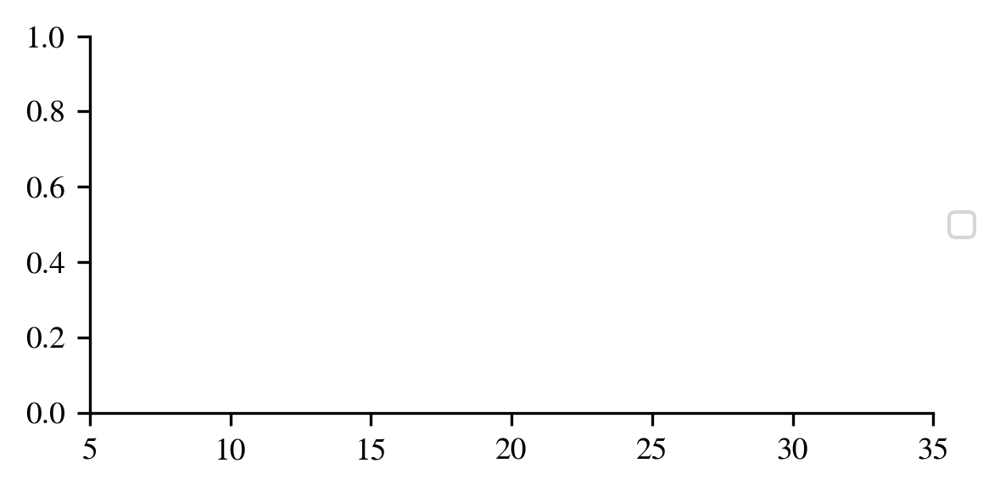

In [ ]:
# fig 03
from matplotlib.rcsetup import cycler

fig, ax = plt.subplots(figsize=(4, 2))
sns.set_palette("colorblind")
ls_cycle = cycler(linestyle=["-", "--", "-.", ":"])
color_cycler = cycler(color=sns.color_palette("colorblind", n_colors=len(ls_cycle)))
ax.set_prop_cycle(ls_cycle + color_cycler)
for file in sorted(
    Path("../data/outputs/converge_N_1D/").glob("*.nc"),
    reverse=True,
    key=lambda x: float(x.stem.split("=")[1]),
):
    da = xr.open_dataset(file).h.isel(t=-1).sel(y=0)
    da = da.roll(x=len(da.x) // 2 - int(da.argmax("x")), roll_coords=False)
    da.plot(linewidth=0.7, label=rf"$N={len(da.x)}$")
ax.set_title("")
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))

ax.set_xlim(5, 35)
sns.despine(trim=True)
fig.tight_layout()
fig.savefig(
    "../reports/figures/fig-03.convergence_N_1D.pdf",
    dpi=300,
    bbox_inches="tight",
)

FileNotFoundError: [Errno 2] No such file or directory: '/home/igin/Documents/Julia/WRM/data/outputs/converge_N_1D/hₛ_ratio=2.0.nc'

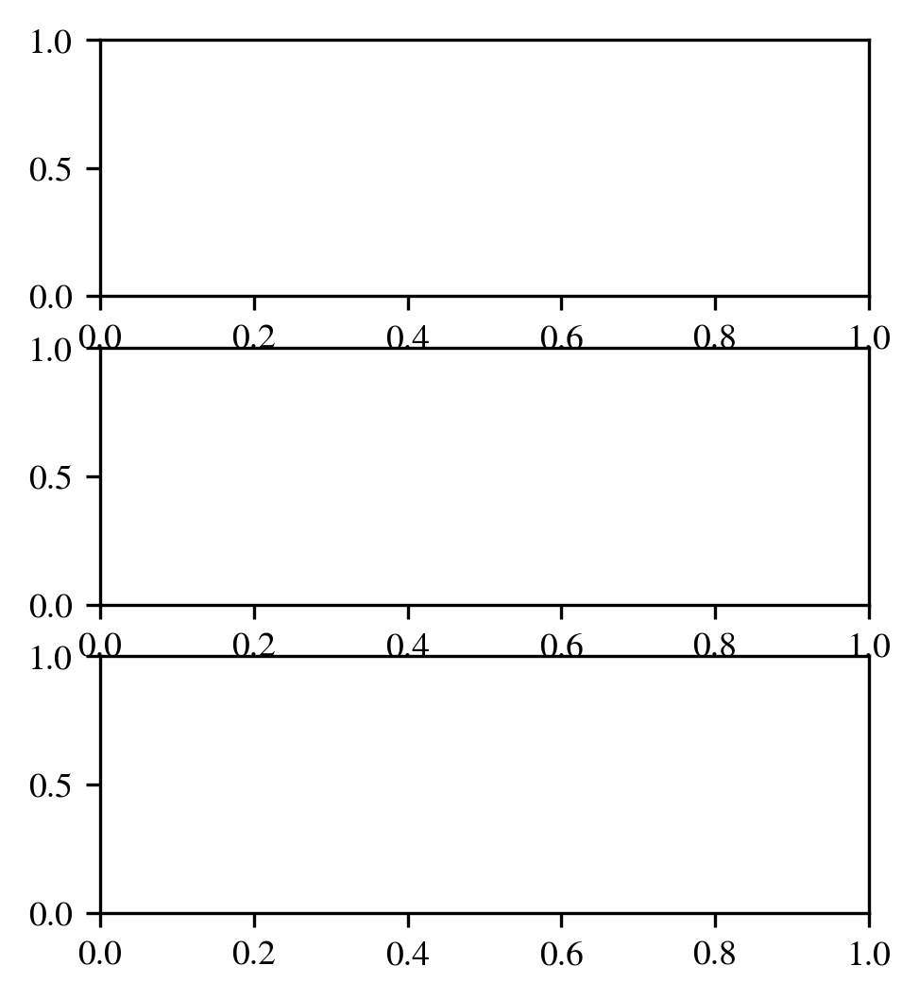

In [13]:
# fig 03b
from matplotlib.rcsetup import cycler
from pyparsing import line

fig, (ax_u, ax_phi, ax_alpha) = plt.subplots(3, figsize=(3.5, 4))
sns.set_palette("colorblind")
ls_cycle = cycler(linestyle=["-", "--", "-.", ":"])
color_cycler = cycler(color=sns.color_palette("colorblind", n_colors=len(ls_cycle)))
ax.set_prop_cycle(ls_cycle + color_cycler)

file = Path("../data/outputs/converge_N_1D/hₛ_ratio=2.0.nc")
ds = xr.open_dataset(file).isel(t=-1).sel(y=0)
ds = ds.roll(x=len(ds.h.x) // 2 - int(ds.h.argmax("x")), roll_coords=False)

ds.ux.plot(linewidth=0.7, label=rf"$N={len(ds.x)}$", ax=ax_u, color="k")
ax_u_twin = ax_u.twinx()
ds["h"].plot(linewidth=0.7, ax=ax_u_twin, color="k", linestyle="--", alpha=0.5)
ax_u_twin.set_yticks([])
ax_u_twin.set_ylabel("")
ax_u_twin.set_title("")

ax_u.set_title("")
ax_u.set_ylabel(r"$u(x)$")
ax_u.set_xlim(5, 35)


(ds["h"] ** 2 * ds["ϕxx"]).plot(
    linewidth=0.7, label=rf"$N={len(ds.x)}$", ax=ax_phi, color="k"
)
ax_phi_twin = ax_phi.twinx()
ds["h"].plot(linewidth=0.7, ax=ax_phi_twin, color="k", linestyle="--", alpha=0.5)
ax_phi_twin.set_yticks([])
ax_phi_twin.set_ylabel("")
ax_phi_twin.set_title("")
ax_phi.set_ylabel(r"$h(x)^2\,\varphi_{11}(x)$")
ax_phi.set_title("")
ax_phi.set_xlim(5, 35)

form_factor = 1.0 + ds.h**2 * ds["ϕxx"] / ds.ux**2

form_factor.plot(linewidth=0.7, label=rf"$N={len(ds.x)}$", ax=ax_alpha, color="k")
ax_alpha.axhline(4 / 3, color="r", linestyle="--", linewidth=0.5)
ax_alpha_twin = ax_alpha.twinx()
ds["h"].plot(linewidth=0.7, ax=ax_alpha_twin, color="k", linestyle="--", alpha=0.5)
ax_alpha_twin.set_yticks([])
ax_alpha_twin.set_ylabel("")
ax_alpha_twin.set_title("")
ax_alpha.set_ylabel(r"$\alpha(x)$")
ax_alpha.set_title("")
ax_alpha.set_xlim(5, 35)

sns.despine(trim=True)
fig.tight_layout()
fig.savefig(
    "../reports/figures/fig-supp1.convergence_N_1D_ux_phixx_alpha.pdf",
    dpi=300,
    bbox_inches="tight",
)

In [401]:
from typing import Dict
from scipy.signal import savgol_filter
from xarray import Dataset
from pathlib import Path
import xarray as xr
import seaborn as sns
import matplotlib.pyplot as plt


def compute_spread_len(ds, h_factor=1.05):
    mask = ds.h > (ds.attrs["hsb"] * h_factor)
    #mask = ds.h > (ds.attrs["hsb"] * h_factor)
    dx = ds.x[1] - ds.x[0]
    return mask.sum("x") * dx
    


def compute_drop_velocity(ds):
    hmax_pos = ds.x[ds.h.argmax("x")]
    ptp = ds.x.max() - ds.x.min()
    area = (hmax_pos.diff("t") < -ptp / 2).cumsum().rename("area")
    largest_area = area.to_dataframe().area.value_counts().index[0]
    hmax_pos = hmax_pos.where(area == largest_area, drop=True)
    c = float(hmax_pos.polyfit("t", deg=1).polyfit_coefficients.sel(degree=1).squeeze())
    return c


datasets: Dict[str, Dataset] = {}
for ds in sorted(Path("../data/outputs/new_hs=0.1/").glob("hsb*.nc")):
    ds = xr.open_dataset(ds).isel(y=0)
    ds["spread_len"] = compute_spread_len(ds)
    ds.attrs["drop_velocity"] = compute_drop_velocity(ds.isel(t=slice(-500, None)))
    datasets[ds.attrs["hsb"]] = ds

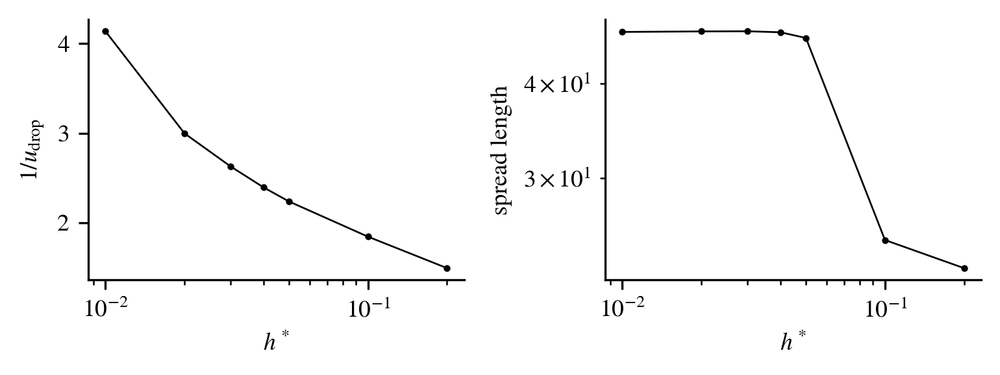

In [402]:
fig, (ax_vel, ax_spread) = plt.subplots(1, 2, figsize=(5.3, 2), sharex=True)

# matplotlib.rc('text', usetex = True)
# matplotlib.rc('font', **{'family' : "sans-serif"})
# params= {'text.latex.preamble' : [r'\usepackage{amsmath}']}
# pyplot.rcParams.update(params)

with plt.rc_context(
    {
        "text.usetex": True,
        "font.family": "sans-serif",
        "text.latex.preamble": r"\usepackage{amsmath}",
    }
):
    ax_vel.plot(
        *zip(*[(hs, 1 / ds.attrs["drop_velocity"]) for hs, ds in datasets.items()]),
        marker=".",
        color="k",
        linewidth=0.65,
        markersize=3,
    )

    ax_vel.set_xscale("log")
    ax_vel.set_xlabel("$h^*$")
    ax_vel.set_ylabel(r"$1 / u_{\rm{drop}}$")
    ax_vel.set_title("")

    sns.despine(ax=ax_vel)

    ax_spread.plot(
        *zip(
            *[
                (hs, ds.spread_len.isel(t=slice(-800, None)).mean())
                for hs, ds in datasets.items()
            ]
        ),
        marker=".",
        color="k",
        linewidth=0.65,
        markersize=3,
    )

    ax_spread.set_xscale("log")
    ax_spread.set_yscale("log")
    ax_spread.set_xlabel("$h^*$")
    ax_spread.set_ylabel("spread length")
    ax_spread.set_title("")

    sns.despine(ax=ax_spread)
    fig.tight_layout()
  

FileNotFoundError: [Errno 2] No such file or directory: '../reports/figures/fig-05.convergence_hs_spread_vel.pdf'

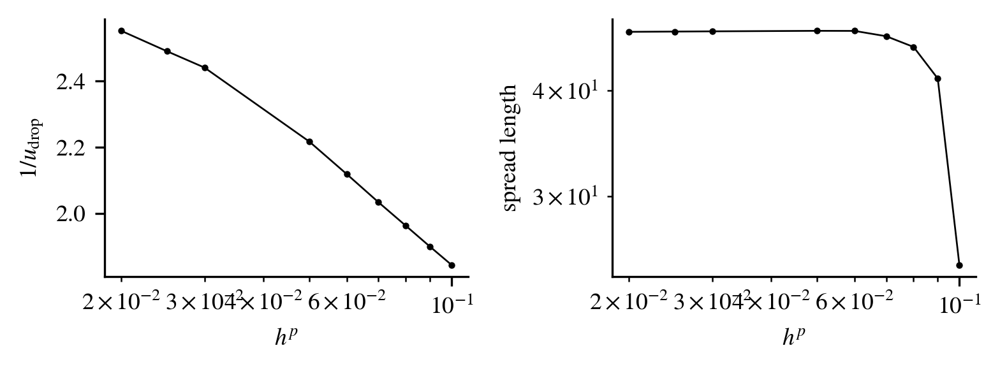

In [144]:
fig, (ax_vel, ax_spread) = plt.subplots(1, 2, figsize=(5.3, 2), sharex=True)

# matplotlib.rc('text', usetex = True)
# matplotlib.rc('font', **{'family' : "sans-serif"})
# params= {'text.latex.preamble' : [r'\usepackage{amsmath}']}
# pyplot.rcParams.update(params)

with plt.rc_context(
    {
        "text.usetex": True,
        "font.family": "sans-serif",
        "text.latex.preamble": r"\usepackage{amsmath}",
    }
):
    ax_vel.plot(
        *zip(*[(hsb, 1 / ds.attrs["drop_velocity"]) for hsb, ds in datasets.items()]),
        marker=".",
        color="k",
        linewidth=0.65,
        markersize=3,
    )

    ax_vel.set_xscale("log")
    ax_vel.set_xlabel("$h^p$")
    ax_vel.set_ylabel(r"$1 / u_{\rm{drop}}$")
    ax_vel.set_title("")

    sns.despine(ax=ax_vel)

    ax_spread.plot(
        *zip(
            *[
                (hsb, ds.spread_len.isel(t=slice(-800, None)).mean())
                for hsb, ds in datasets.items()
            ]
        ),
        marker=".",
        color="k",
        linewidth=0.65,
        markersize=3,
    )

    ax_spread.set_xscale("log")
    ax_spread.set_yscale("log")
    ax_spread.set_xlabel("$h^p$")
    ax_spread.set_ylabel("spread length")
    ax_spread.set_title("")

    sns.despine(ax=ax_spread)
    fig.tight_layout()
    fig.savefig(
        "../reports/figures/fig-05.convergence_hs_spread_vel.pdf",
        dpi=300,
        bbox_inches="tight",
    )

FileNotFoundError: [Errno 2] No such file or directory: '../reports/figures/fig-05.convergence_hs_spread_vel.pdf'

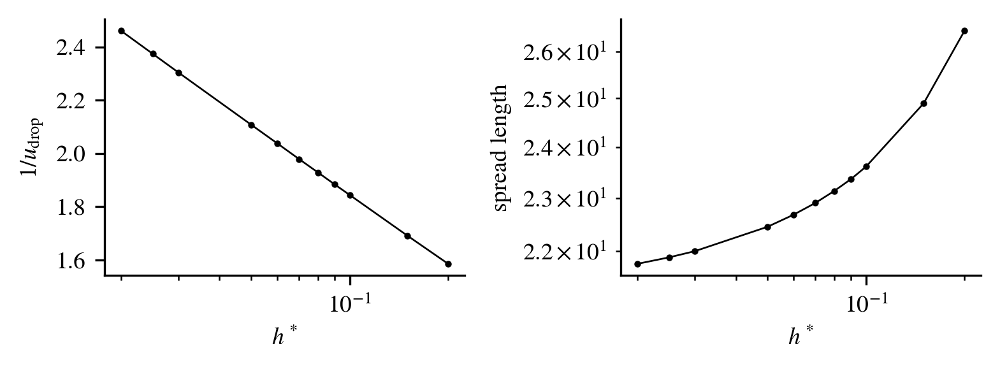

In [79]:
fig, (ax_vel, ax_spread) = plt.subplots(1, 2, figsize=(5.3, 2), sharex=True)

# matplotlib.rc('text', usetex = True)
# matplotlib.rc('font', **{'family' : "sans-serif"})
# params= {'text.latex.preamble' : [r'\usepackage{amsmath}']}
# pyplot.rcParams.update(params)

with plt.rc_context(
    {
        "text.usetex": True,
        "font.family": "sans-serif",
        "text.latex.preamble": r"\usepackage{amsmath}",
    }
):
    ax_vel.plot(
        *zip(*[(hs, 1 / ds.attrs["drop_velocity"]) for hs, ds in datasets.items()]),
        marker=".",
        color="k",
        linewidth=0.65,
        markersize=3,
    )

    ax_vel.set_xscale("log")
    ax_vel.set_xlabel("$h^*$")
    ax_vel.set_ylabel(r"$1 / u_{\rm{drop}}$")
    ax_vel.set_title("")

    sns.despine(ax=ax_vel)

    ax_spread.plot(
        *zip(
            *[
                (hs, ds.spread_len.isel(t=slice(-800, None)).mean())
                for hs, ds in datasets.items()
            ]
        ),
        marker=".",
        color="k",
        linewidth=0.65,
        markersize=3,
    )

    ax_spread.set_xscale("log")
    ax_spread.set_yscale("log")
    ax_spread.set_xlabel("$h^*$")
    ax_spread.set_ylabel("spread length")
    ax_spread.set_title("")

    sns.despine(ax=ax_spread)
    fig.tight_layout()
    fig.savefig(
        "../reports/figures/fig-05.convergence_hs_spread_vel.pdf",
        dpi=300,
        bbox_inches="tight",
    )

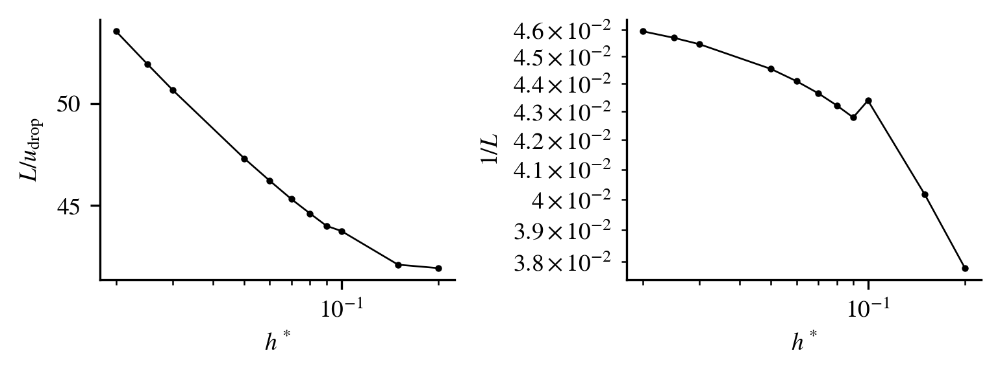

In [ ]:
fig, (ax_vel, ax_spread) = plt.subplots(1, 2, figsize=(5.3, 2), sharex=True)

# matplotlib.rc('text', usetex = True)
# matplotlib.rc('font', **{'family' : "sans-serif"})
# params= {'text.latex.preamble' : [r'\usepackage{amsmath}']}
# pyplot.rcParams.update(params)

with plt.rc_context(
    {
        "text.usetex": True,
        "font.family": "sans-serif",
        "text.latex.preamble": r"\usepackage{amsmath}",
    }
):
    ax_vel.plot(
        *zip(
            *[
                (
                    hs,
                    ds.spread_len.isel(t=slice(-800, None)).mean()
                    / ds.attrs["drop_velocity"],
                )
                for hs, ds in datasets.items()
            ]
        ),
        marker=".",
        color="k",fig, (ax_vel, ax_spread) = plt.subplots(1, 2, figsize=(5.3, 2), sharex=True)

# matplotlib.rc('text', usetex = True)
# matplotlib.rc('font', **{'family' : "sans-serif"})
# params= {'text.latex.preamble' : [r'\usepackage{amsmath}']}
# pyplot.rcParams.update(params)

with plt.rc_context(
    {
        "text.usetex": True,
        "font.family": "sans-serif",
        "text.latex.preamble": r"\usepackage{amsmath}",
    }
):
    ax_vel.plot(
        *zip(*[(hsb, 1 / ds.attrs["drop_velocity"]) for hsb, ds in datasets.items()]),
        marker=".",
        color="k",
        linewidth=0.65,
        markersize=3,
    )

    ax_vel.set_xscale("log")
    ax_vel.set_xlabel("$h^p$")
    ax_vel.set_ylabel(r"$1 / u_{\rm{drop}}$")
    ax_vel.set_title("")

    sns.despine(ax=ax_vel)

    ax_spread.plot(
        *zip(
            *[
                (hsb, ds.spread_len.isel(t=slice(-800, None)).mean())
                for hsb, ds in datasets.items()
            ]
        ),
        marker=".",
        color="k",
        linewidth=0.65,
        markersize=3,
    )

    ax_spread.set_xscale("log")
    ax_spread.set_yscale("log")
    ax_spread.set_xlabel("$h^p$")
    ax_spread.set_ylabel("spread length")
    ax_spread.set_title("")

    sns.despine(ax=ax_spread)
    fig.tight_layout()
    fig.savefig(
        "../reports/figures/fig-05.convergence_hs_spread_vel.pdf",
        dpi=300,
        bbox_inches="tight",
    )
        linewidth=0.65,
        markersize=3,
    )

    ax_vel.set_xscale("log")
    ax_vel.set_xlabel("$h^*$")
    ax_vel.set_ylabel(r"$L / u_{\rm{drop}}$")
    ax_vel.set_title("")

    sns.despine(ax=ax_vel)

    ax_spread.plot(
        *zip(
            *[
                (hs, 1 / ds.spread_len.isel(t=slice(-800, None)).mean())
                for hs, ds in datasets.items()
            ]
        ),
        marker=".",
        color="k",
        linewidth=0.65,
        markersize=3,
    )

    ax_spread.set_xscale("log")
    ax_spread.set_yscale("log")
    ax_spread.set_xlabel("$h^*$")
    ax_spread.set_ylabel(r"$1 / L$")
    ax_spread.set_title("")

    sns.despine(ax=ax_spread)
    fig.tight_layout()
    # fig.savefig(
    #     "../reports/figures/fig-05.convergence_hs_spread_vel.pdf",
    #     dpi=300,
    #     bbox_inches="tight",
    # )

In [242]:
fig, axs = plt.subplots(
    1,1,igsize=(5.3, 4.5), sharex=True, sharey=True, constrained_layout=True
)
ref = datasets[0.02].h.isel(t=-1)
ref = ref.roll(x=len(ref.x) // 2 - int(ref.argmax("x"))) - 0.02

for hs, ax in zip(reversed(datasets.keys()), axs.flatten()):
    ds = datasets[hs]
    xmin, xmax = ds.x.min(), ds.x.max()
    # n_traces = 10
    # step = len(ds.t) // n_traces
    # for i, t in enumerate(ds.t[::step]):
    #     if i == 0:
    #         continue
    #     frame = ds.h.sel(t=t)
    #     frame = frame.roll(x=len(ds.x) // 2 - int(frame.argmax("x")))
    #     frame.plot(ax=ax, color="k", alpha=(i / n_traces) * (0.8 - 0.1) + 0.1, linewidth=0.65)
    frame = ds.h.isel(t=-1)
    frame = frame.roll(x=len(ds.x) // 2 - int(frame.argmax("x")))
    ax.hlines(
        ds.attrs["hₛ"] * 1.1, xmin, xmax, color="r", linestyle="--", linewidth=0.65
    )
    (ref + hs).plot(ax=ax, color="red", linewidth=0.65, linestyle="--")
    frame.plot(ax=ax, color="k", linewidth=0.65)
    ax.set_title(rf"$h^p = {ds.attrs['hₛ']:.2f}$")
    ax.set_xlim(-5, 25)
    sns.despine(trim=True)
[ax.set_xlabel("") for ax in axs[:-1, :].flat]
[ax.set_ylabel("") for ax in axs[:, 1:].flat]

fig.tight_layout()
fig.savefig(
    "../reports/figures/fig-04.convergence_hs_h.pdf",
    dpi=300,
    bbox_inches="tight",
)

AttributeError: Figure.set() got an unexpected keyword argument 'igsize'

/tmp/ipykernel_10515/4012714736.py:31: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


FileNotFoundError: [Errno 2] No such file or directory: '../reports/figures/fig-04.convergence_hs_h.pdf'

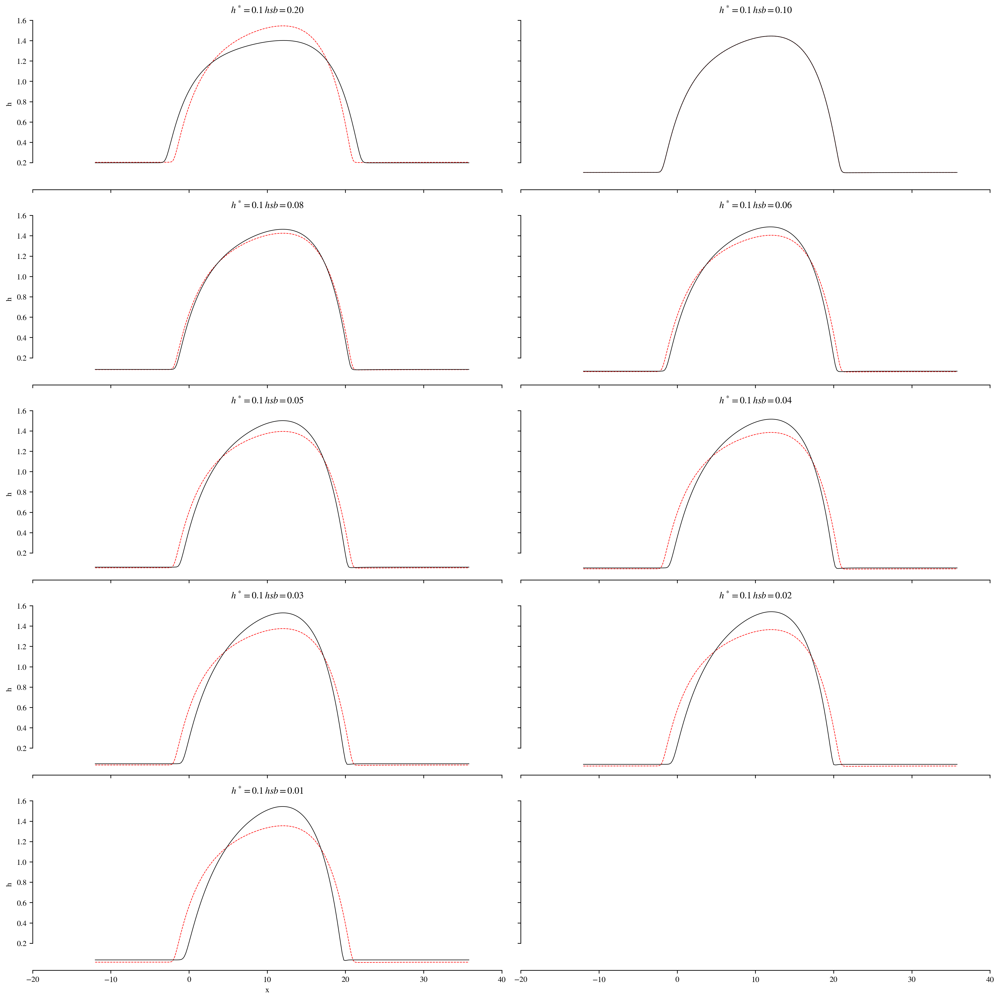

In [354]:
fig, axs = plt.subplots(
    5, 2, figsize=(16, 16), sharex=True, sharey=True, constrained_layout=True
)
ref = datasets[0.1].h.isel(t=-1)-0.1
ref = ref.roll(x=len(ref.x) // 2 - int(ref.argmax("x"))) 

for hs, ax in zip(reversed(datasets.keys()), axs.flatten()):
    ds = datasets[hs]
    xmin, xmax = ds.x.min(), ds.x.max()
    # n_traces = 10
    # step = len(ds.t) // n_traces
    # for i, t in enumerate(ds.t[::step]):
    #     if i == 0:
    #         continue
    #     frame = ds.h.sel(t=t)
    #     frame = frame.roll(x=len(ds.x) // 2 - int(frame.argmax("x")))
    #     frame.plot(ax=ax, color="k", alpha=(i / n_traces) * (0.8 - 0.1) + 0.1, linewidth=0.65)
    frame = ds.h.isel(t=-1)
    frame = frame.roll(x=len(ds.x) // 2 - int(frame.argmax("x")))
    #ax.hlines(
    #    ds.attrs["hsb"], xmin, xmax, color="r", linestyle="--", linewidth=0.65
    #)
    (ref + hs).plot(ax=ax, color="red", linewidth=0.65, linestyle="--")
    frame.plot(ax=ax, color="k", linewidth=0.65)
    ax.set_title(rf"$h^*=0.1 \: hsb = {ds.attrs['hsb']:.2f}$")
    ax.set_xlim(-20, 40)
    sns.despine(trim=True)
[ax.set_xlabel("") for ax in axs[:-1, :].flat]
[ax.set_ylabel("") for ax in axs[:, 1:].flat]

fig.tight_layout()
fig.savefig(
    "../reports/figures/fig-04.convergence_hs_h.pdf",
    dpi=300,
    bbox_inches="tight",
)

/tmp/ipykernel_854271/2838629981.py:31: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


FileNotFoundError: [Errno 2] No such file or directory: '../reports/figures/fig-04.convergence_hs_h.pdf'

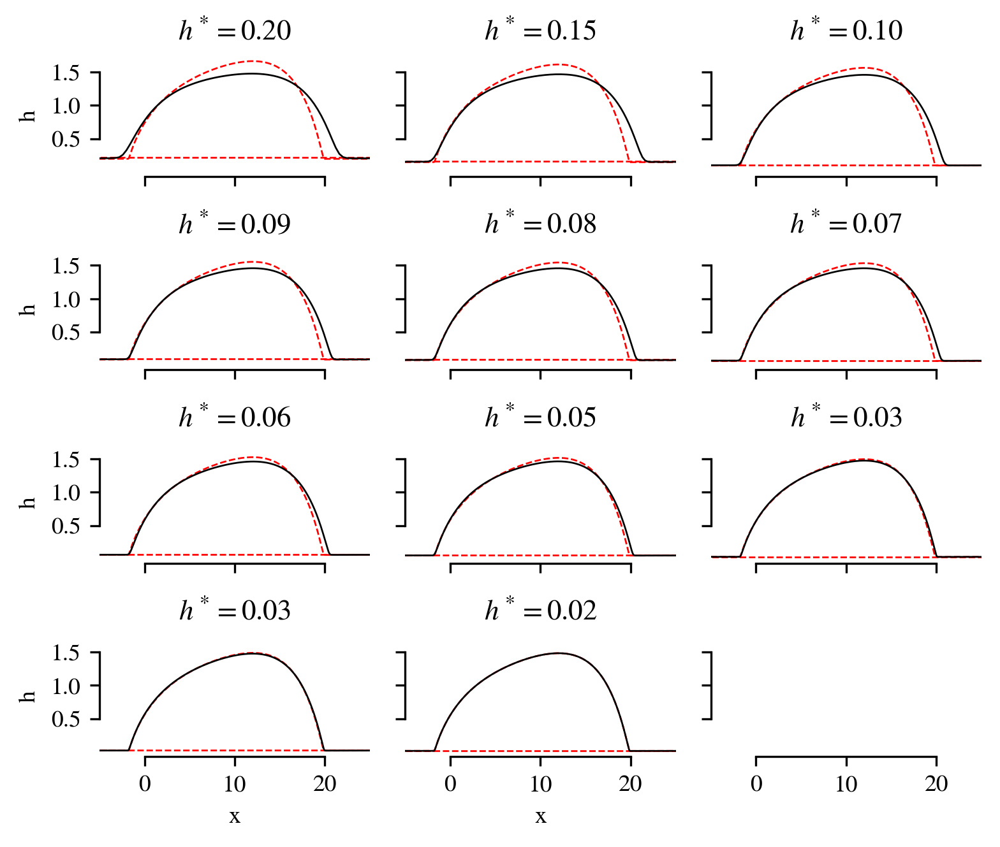

In [82]:
fig, axs = plt.subplots(
    4, 3, figsize=(5.3, 4.5), sharex=True, sharey=True, constrained_layout=True
)
ref = datasets[0.02].h.isel(t=-1)
ref = ref.roll(x=len(ref.x) // 2 - int(ref.argmax("x"))) - 0.02

for hs, ax in zip(reversed(datasets.keys()), axs.flatten()):
    ds = datasets[hs]
    xmin, xmax = ds.x.min(), ds.x.max()
    # n_traces = 10
    # step = len(ds.t) // n_traces
    # for i, t in enumerate(ds.t[::step]):
    #     if i == 0:
    #         continue
    #     frame = ds.h.sel(t=t)
    #     frame = frame.roll(x=len(ds.x) // 2 - int(frame.argmax("x")))
    #     frame.plot(ax=ax, color="k", alpha=(i / n_traces) * (0.8 - 0.1) + 0.1, linewidth=0.65)
    frame = ds.h.isel(t=-1)
    frame = frame.roll(x=len(ds.x) // 2 - int(frame.argmax("x")))
    ax.hlines(
        ds.attrs["hₛ"] * 1.1, xmin, xmax, color="r", linestyle="--", linewidth=0.65
    )
    (ref + hs).plot(ax=ax, color="red", linewidth=0.65, linestyle="--")
    frame.plot(ax=ax, color="k", linewidth=0.65)
    ax.set_title(rf"$h^* = {ds.attrs['hₛ']:.2f}$")
    ax.set_xlim(-5, 25)
    sns.despine(trim=True)
[ax.set_xlabel("") for ax in axs[:-1, :].flat]
[ax.set_ylabel("") for ax in axs[:, 1:].flat]

fig.tight_layout()
fig.savefig(
    "../reports/figures/fig-04.convergence_hs_h.pdf",
    dpi=300,
    bbox_inches="tight",
)

[Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, ''),
 Text(0, 0.5, '')]

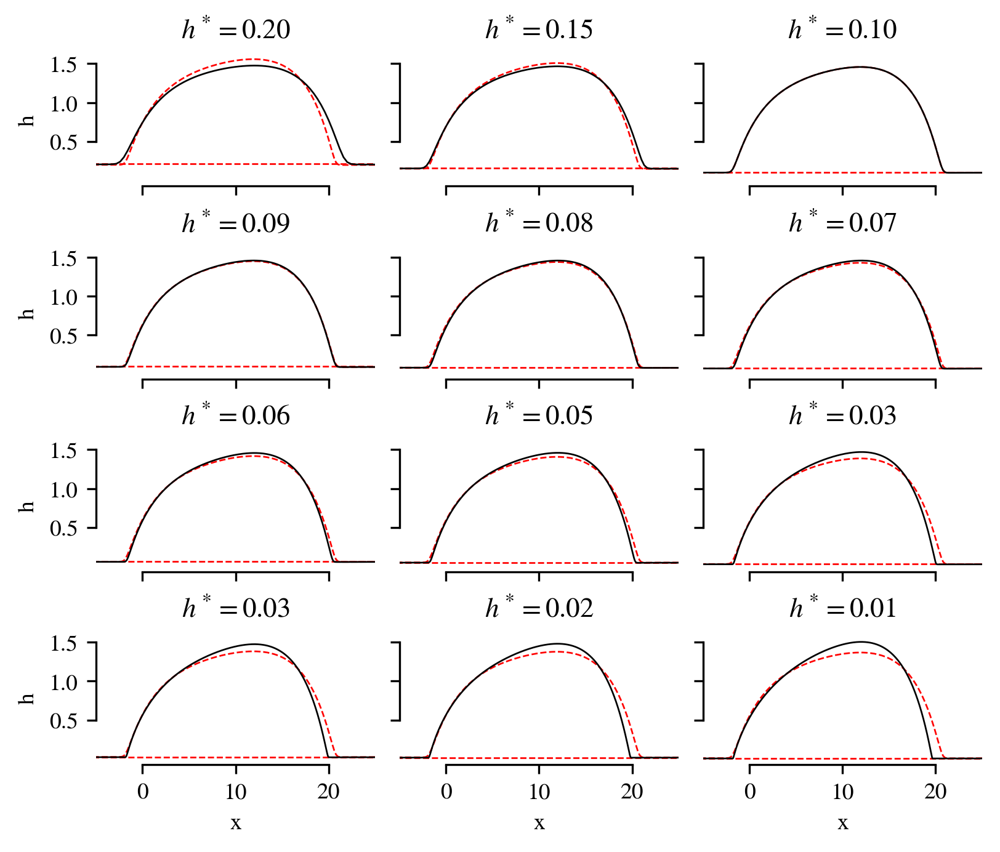

In [73]:
fig, axs = plt.subplots(
    4, 3, figsize=(5.3, 4.5), sharex=True, sharey=True, constrained_layout=True
)
ref = datasets[0.1].h.isel(t=-1)
ref = ref.roll(x=len(ref.x) // 2 - int(ref.argmax("x"))) - 0.1

for hs, ax in zip(reversed(datasets.keys()), axs.flatten()):
    ds = datasets[hs]
    xmin, xmax = ds.x.min(), ds.x.max()
    # n_traces = 10
    # step = len(ds.t) // n_traces
    # for i, t in enumerate(ds.t[::step]):
    #     if i == 0:
    #         continue
    #     frame = ds.h.sel(t=t)
    #     frame = frame.roll(x=len(ds.x) // 2 - int(frame.argmax("x")))
    #     frame.plot(ax=ax, color="k", alpha=(i / n_traces) * (0.8 - 0.1) + 0.1, linewidth=0.65)
    frame = ds.h.isel(t=-1)
    frame = frame.roll(x=len(ds.x) // 2 - int(frame.argmax("x")))
    ax.hlines(
        ds.attrs["hₛ"] * 1.1, xmin, xmax, color="r", linestyle="--", linewidth=0.65
    )
    (ref + hs).plot(ax=ax, color="red", linewidth=0.65, linestyle="--")
    frame.plot(ax=ax, color="k", linewidth=0.65)
    ax.set_title(rf"$h^* = {ds.attrs['hₛ']:.2f}$")
    ax.set_xlim(-5, 25)
    sns.despine(trim=True)
[ax.set_xlabel("") for ax in axs[:-1, :].flat]
[ax.set_ylabel("") for ax in axs[:, 1:].flat]



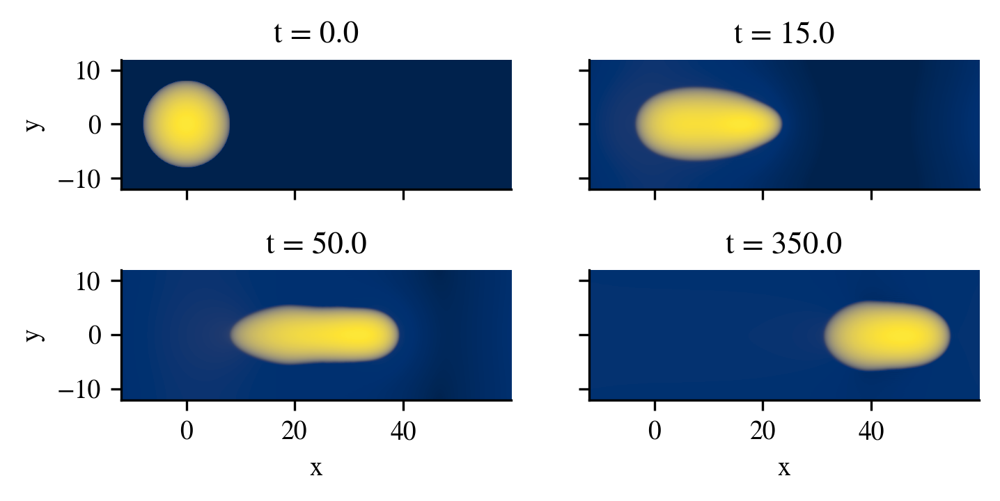

In [ ]:
# fig 04
ds = xr.open_dataset("../data/outputs/2D_simple/dθₛ=5.nc")
# use serif
fig, axs = plt.subplots(2, 2, figsize=(5.3, 2.4), sharex=True, sharey=True)
for ax, t in zip(axs.flat, [0, 15, 50, 350]):
    ds.h.sel(t=t).plot.imshow(
        cmap="cividis",
        interpolation="antialiased",
        add_colorbar=False,
        norm=plt.matplotlib.colors.PowerNorm(0.3),
        ax=ax,
    )
    ax.set_aspect("equal")
    sns.despine()
[ax.set_xlabel("") for ax in axs[0, :]]
[ax.set_ylabel("") for ax in axs[:, -1]]
fig.savefig(
    "../reports/figures/fig-06.one_drop_2D_h_hyst.pdf",
    dpi=300,
    bbox_inches="tight",
)

In [ ]:
# fig 05

ds = xr.open_dataset("../data/outputs/2D_simple/dθₛ=5.nc")
ds = ds.sel(t=400)
ds = ds.roll(x=len(ds.x) // 2 - int(ds.sel(y=0).h.argmax("x")), roll_coords=False)

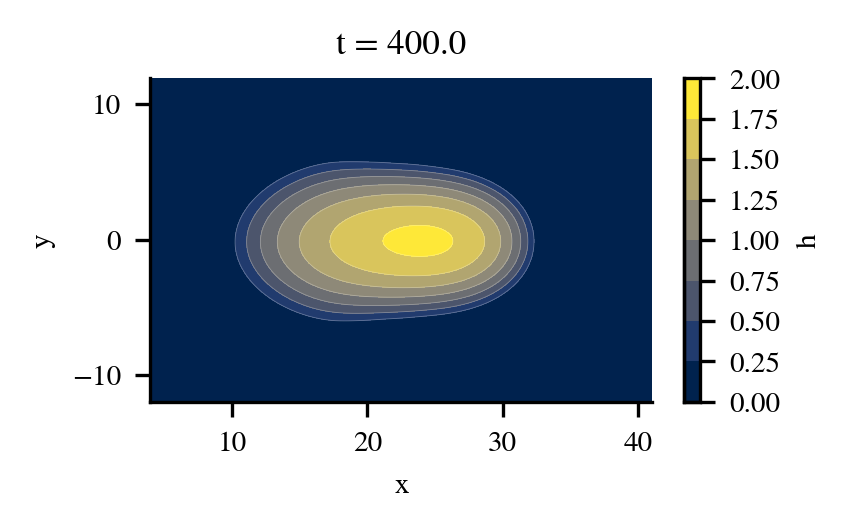

In [ ]:
# (a)
with plt.rc_context({"font.size": 7}):
    fig, ax = plt.subplots(figsize=(2.7, 1.4))
    ax.set_aspect("equal", "datalim")
    ds.h.plot.contourf(
        levels=np.arange(0, 2.1, 0.25), cmap="cividis", add_colorbar=True, ax=ax
    )
    ds.h.plot.contour(
        levels=np.arange(0, 2.1, 0.25), colors="white", linewidths=0.2, alpha=0.3, ax=ax
    )
    ax.set_xlim(5, 40)
    sns.despine()
    fig.savefig(
        "../reports/figures/fig-07.a.one_drop_2D_h_dtheta_5.pdf",
        dpi=300,
        bbox_inches="tight",
    )

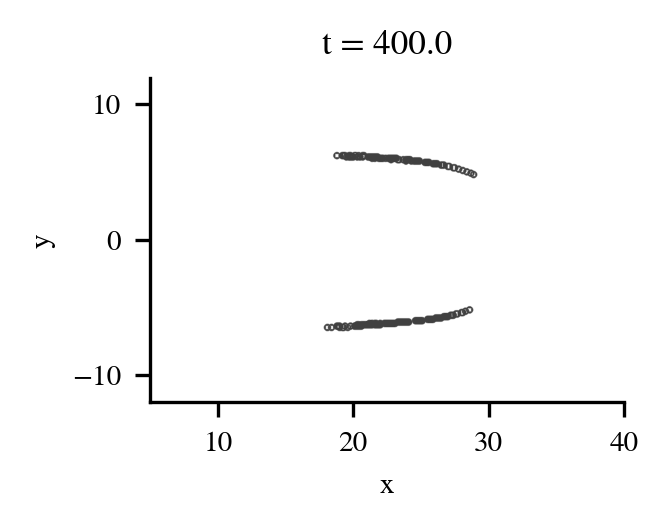

In [ ]:
# (b)
with plt.rc_context({"font.size": 7}):
    fig, ax = plt.subplots(figsize=(2.7, 1.4))
    ax.set_aspect("equal", "box")

    dx_hux = (ds.h * ds.ux).differentiate("x")
    dy_huy = (ds.h * ds.uy).differentiate("y")
    div_hU = dx_hux + dy_huy

    flag = (
        (1.2 * ds.attrs["hₛ"] < ds.h)
        & (ds.h < 2 * ds.attrs["hₛ"])
        & (np.abs(div_hU) < 1e-3)
    )
    flag.plot.contour(ax=ax, cmap="Greys", add_colorbar=False)

    ax.set_xlim(5, 40)
    sns.despine()
    fig.savefig(
        "../reports/figures/fig-07.b.one_drop_2D_flag_reg.pdf",
        dpi=300,
        bbox_inches="tight",
    )

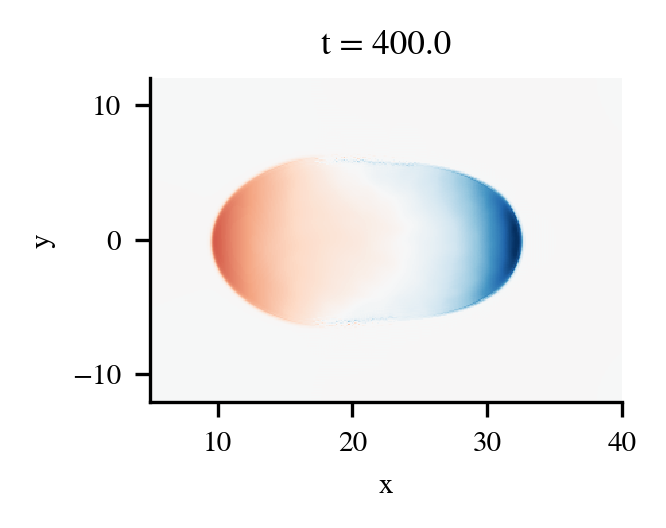

In [ ]:
# (c)
with plt.rc_context({"font.size": 7}):
    fig, ax = plt.subplots(figsize=(2.7, 1.4))
    ax.set_aspect("equal", "box")

    dx_hux = (ds.h * ds.ux).differentiate("x")
    dy_huy = (ds.h * ds.uy).differentiate("y")
    div_hU = dx_hux + dy_huy
    div_hU.plot.pcolormesh(add_colorbar=False, ax=ax, rasterized=True)
    ax.set_xlim(5, 40)
    sns.despine()
    fig.savefig(
        "../reports/figures/fig-07.c.one_drop_2D_div_hU.pdf",
        dpi=300,
        bbox_inches="tight",
    )

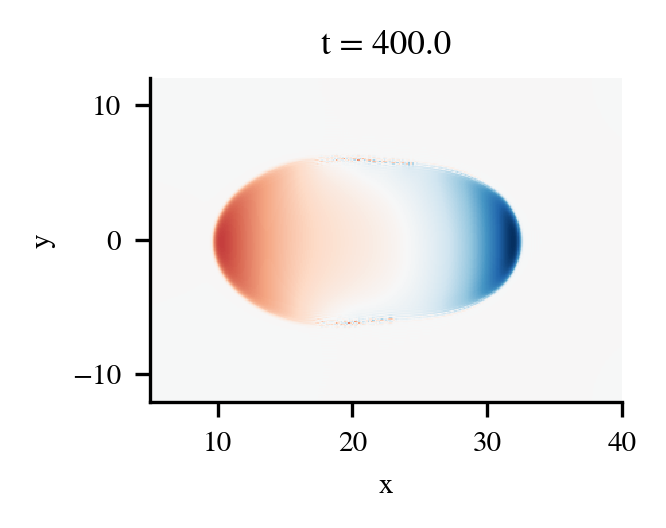

In [ ]:
# (d)
with plt.rc_context({"font.size": 7}):
    fig, ax = plt.subplots(figsize=(2.7, 1.4))
    ax.set_aspect("equal", "box")

    dx_h = ds.h.differentiate("x")
    dy_h = ds.h.differentiate("y")

    U_gradh = ds.ux * dx_h + ds.uy * dy_h
    U_gradh.plot.pcolormesh(add_colorbar=False, ax=ax, rasterized=True)
    ax.set_xlim(5, 40)
    sns.despine()

    fig.savefig(
        "../reports/figures/fig-07.d.one_drop_2D_U_gradh.pdf",
        dpi=300,
        bbox_inches="tight",
    )

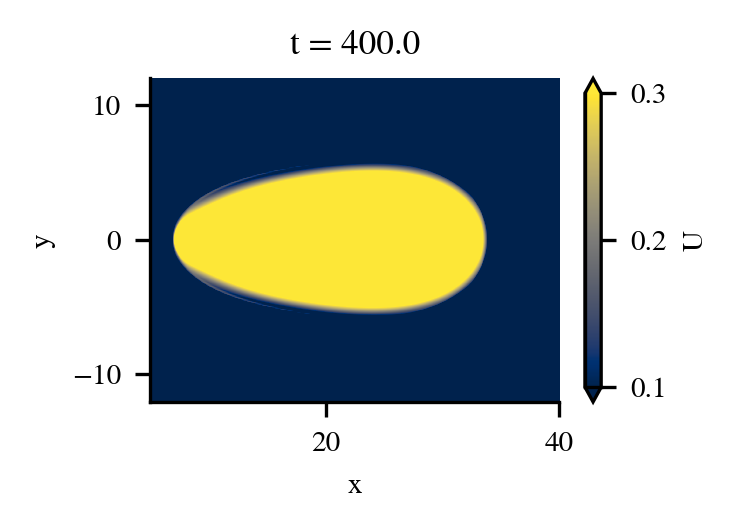

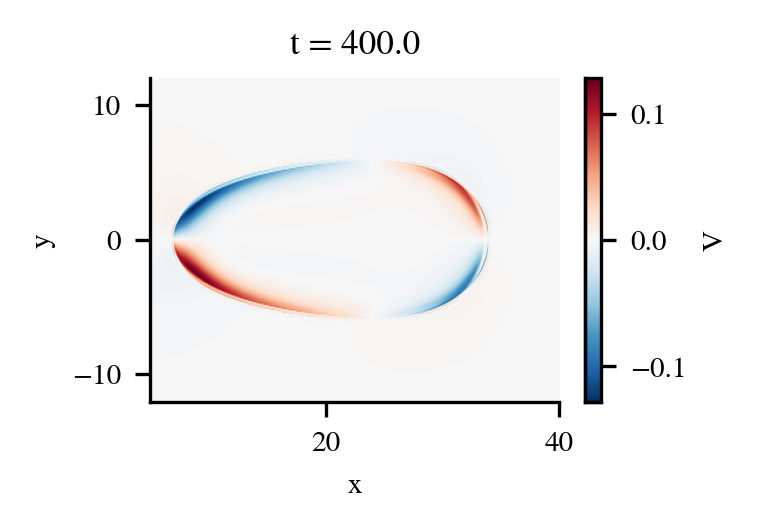

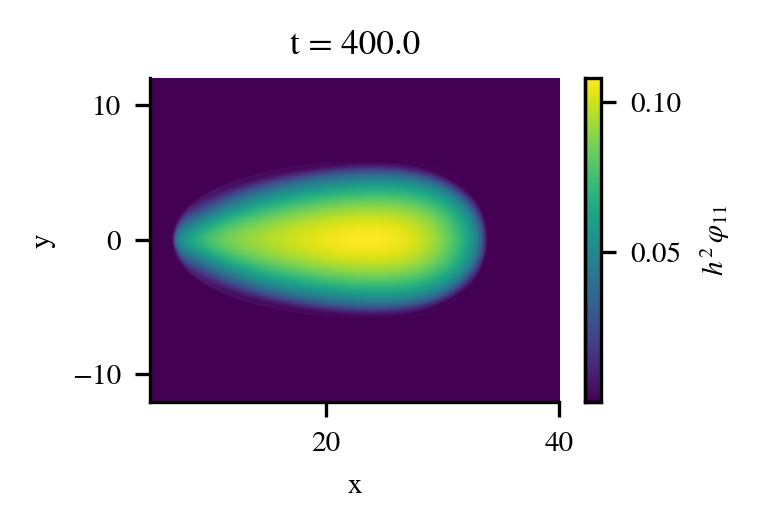

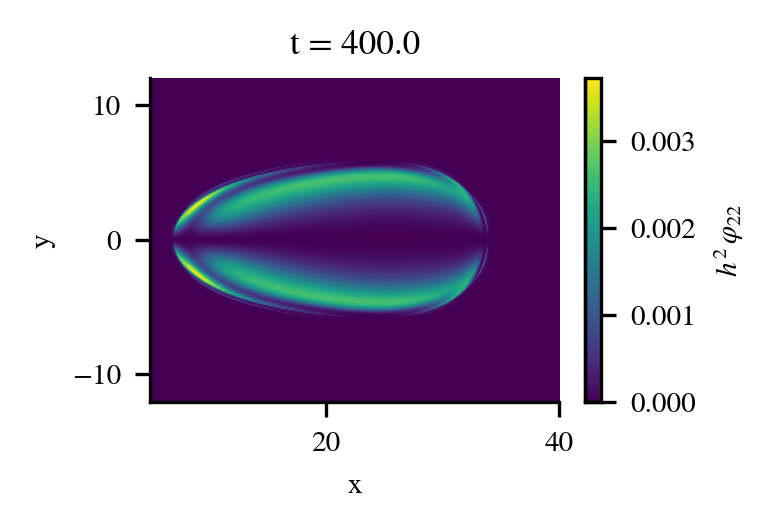

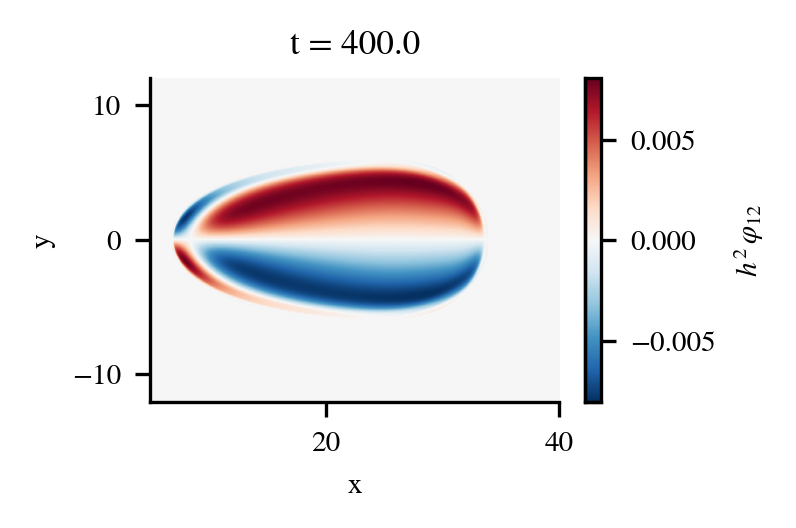

In [ ]:
ds = xr.open_dataset("../data/outputs/2D_simple/dθₛ=0.nc")
ds = ds.sel(t=400)
ds = ds.roll(x=len(ds.x) // 2 - int(ds.sel(y=0).h.argmax("x")), roll_coords=False)

with plt.rc_context({"font.size": 7}):
    fig, ax = plt.subplots(figsize=(2.2, 1.4))
    ax.set_aspect("equal", "datalim")
    da = ds.ux  # .in
    da.rename(r"U").plot.imshow(
        interpolation="hamming", cmap="cividis", vmin=0.1, vmax=0.3, ax=ax
    )
    # set colorbar label
    ax.set_xlim(5, 40)
    sns.despine()
    fig.savefig(
        "../reports/figures/fig-supp2.a.one_drop_2D_U_dtheta_0.pdf",
        dpi=300,
        bbox_inches="tight",
    )

with plt.rc_context({"font.size": 7}):
    fig, ax = plt.subplots(figsize=(2.2, 1.4))
    ax.set_aspect("equal", "datalim")
    da = ds.uy  # .in
    da.rename(r"V").plot.imshow(interpolation="hamming", ax=ax)
    ax.set_xlim(5, 40)
    sns.despine()
    fig.savefig(
        "../reports/figures/fig-supp2.b.one_drop_2D_V_dtheta_0.pdf",
        dpi=300,
        bbox_inches="tight",
    )

with plt.rc_context({"font.size": 7}):
    fig, ax = plt.subplots(figsize=(2.2, 1.4))
    ax.set_aspect("equal", "datalim")
    da = ds["h"] ** 2 * ds["ϕxx"]
    da.rename(r"$h^2\,\varphi_{11}$").plot.imshow(interpolation="hamming", ax=ax)
    ax.set_xlim(5, 40)
    sns.despine()
    fig.savefig(
        "../reports/figures/fig-supp2.c.one_drop_2D_h2phixx_dtheta_0.pdf",
        dpi=300,
        bbox_inches="tight",
    )

with plt.rc_context({"font.size": 7}):
    fig, ax = plt.subplots(figsize=(2.2, 1.4))
    ax.set_aspect("equal", "datalim")
    da = ds["h"] ** 2 * ds["ϕyy"]
    da.rename(r"$h^2\,\varphi_{22}$").plot.imshow(interpolation="hamming", ax=ax)
    ax.set_xlim(5, 40)
    sns.despine()
    fig.savefig(
        "../reports/figures/fig-supp2.d.one_drop_2D_h2phiyy_dtheta_0.pdf",
        dpi=300,
        bbox_inches="tight",
    )

with plt.rc_context({"font.size": 7}):
    fig, ax = plt.subplots(figsize=(2.2, 1.4))
    ax.set_aspect("equal", "datalim")
    da = ds["h"] ** 2 * ds["ϕxy"]
    da.rename(r"$h^2\,\varphi_{12}$").plot.imshow(interpolation="hamming", ax=ax)
    ax.set_xlim(5, 40)
    sns.despine()
    fig.savefig(
        "../reports/figures/fig-supp2.e.one_drop_2D_h2phixy_dtheta_0.pdf",
        dpi=300,
        bbox_inches="tight",
    )

\begin{tabular}{lrrrr}
 & L & l & S & $h_{max}$ \\
dθₛ &  &  &  &  \\
0 & 27.200000 & 12.100000 & 261.640000 & 1.627094 \\
5 & 23.500000 & 12.900000 & 245.440000 & 1.807359 \\
9 & 19.500000 & 15.500000 & 238.340000 & 1.944052 \\
\end{tabular}



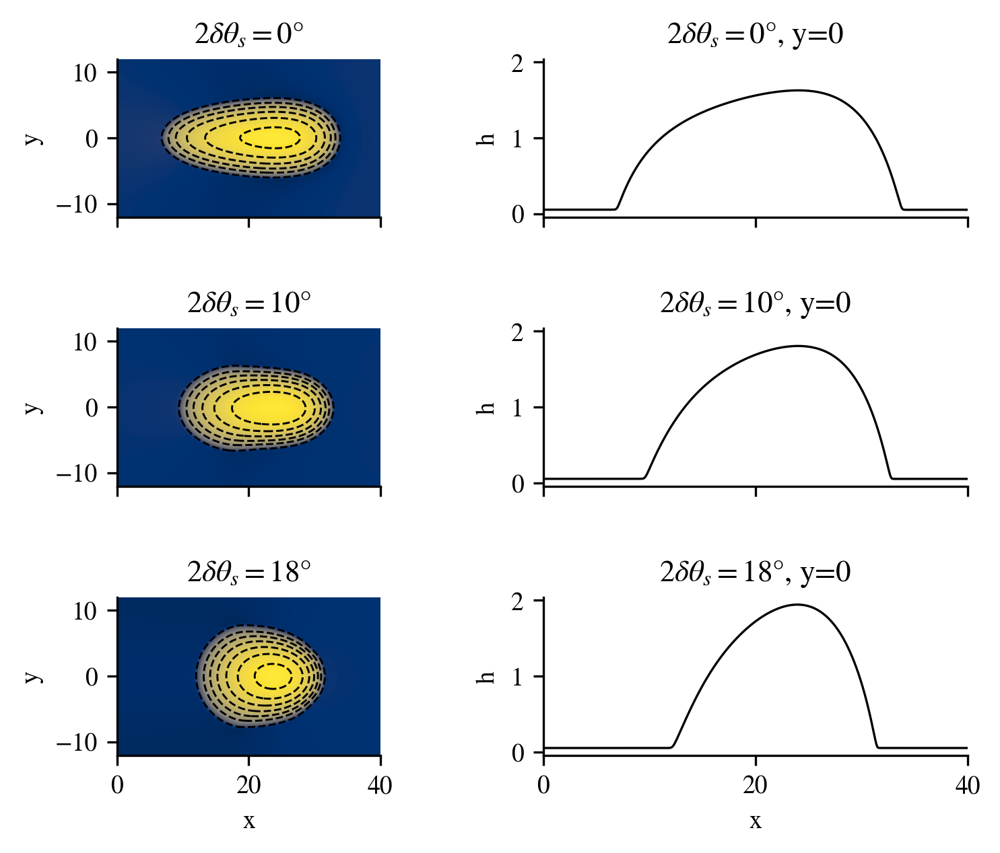

In [ ]:
# fig 06
import pandas as pd


fig, axs = plt.subplots(3, 2, figsize=(5.3, 4.3), sharex=True, sharey="col")

res = []
for i, ((ax_main, ax_side), dθₛ) in enumerate(zip(axs, [0, 5, 9]), start=1):
    da = xr.open_dataset(f"../data/outputs/2D_simple/dθₛ={dθₛ}.nc").h.sel(t=350)
    # center with hmax
    da = da.roll(x=len(da.x) // 2 - int(da.sel(y=0).argmax("x")), roll_coords=False)
    δx = da.x[1] - da.x[0]
    in_drop = da > ds.attrs["hₛ"] * 1.1
    L = float(in_drop.sum("x").max() * δx)
    l = float(in_drop.sum("y").max() * δx)
    S = float(in_drop.sum() * δx**2)
    hmax = float(da.max())
    res.append([dθₛ, L, l, S, hmax])

    da.plot.imshow(
        cmap="cividis",
        interpolation="antialiased",
        add_colorbar=False,
        norm=plt.matplotlib.colors.PowerNorm(0.3),
        ax=ax_main,
    )

    cs = da.plot.contour(
        levels=np.linspace(5.5e-2, 2.1, 8),
        colors="black",
        linewidths=0.7,
        linestyles="--",
        ax=ax_main,
    )
    ax_main.set_xlim(0, 40)
    ax_main.set_aspect("equal")
    ax_main.set_title(rf"$2\delta\theta_s={2*dθₛ}°$")

    da.isel(y=len(da.y) // 2).plot(ax=ax_side, color="black", linewidth=0.8)
    ax_side.set_title(rf"$2\delta\theta_s={2*dθₛ}°$, y={0}")
    sns.despine()
df = (
    pd.DataFrame(res, columns=["dθₛ", "L", "l", "S", r"$h_{max}$"])
    .set_index("dθₛ")
    .sort_index()
)


fig.tight_layout()
[ax.set_xlabel("") for ax in axs[:-1, :].flat]
fig.savefig(
    f"../reports/figures/fig-08.one_drop_2D_h_dthetas.pdf",
    dpi=300,
    bbox_inches="tight",
)
print(df.style.to_latex())

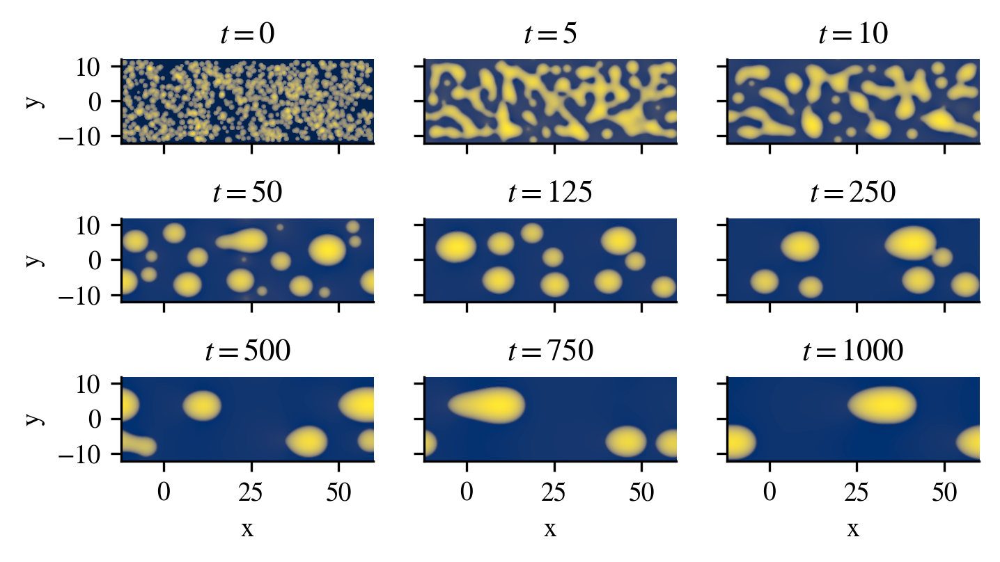

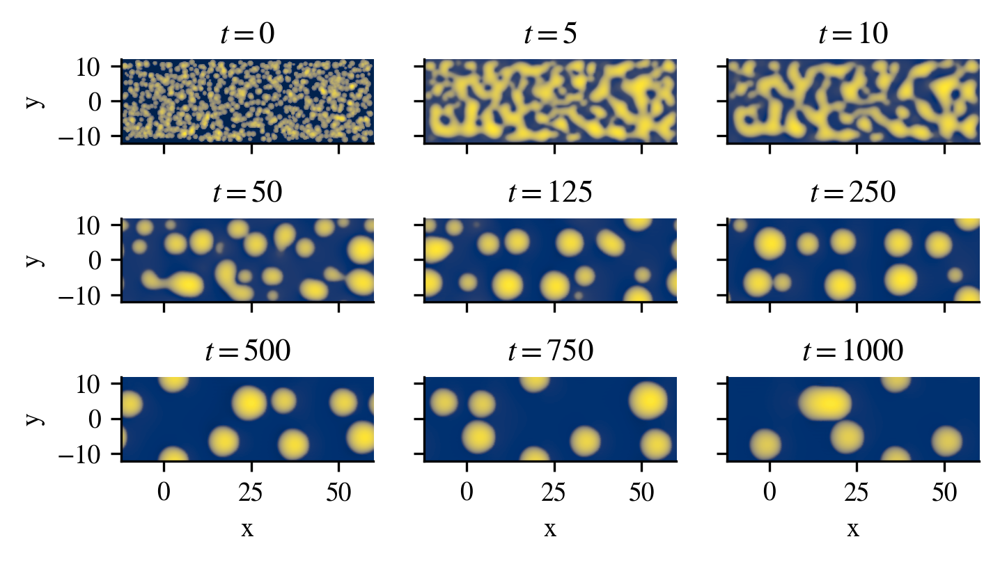

In [ ]:
# fig 09+

for j, dθₛ in enumerate([0, 7]):
    fig, axs = plt.subplots(3, 3, figsize=(5.3, 2.8), sharex=True, sharey=True)
    ts = [0, 5, 10, 50, 125, 250, 500, 750, 1000]
    if not Path(f"../data/outputs/2D_multi_drop/dθₛ={dθₛ}.nc.done").exists():
        continue
    ds = xr.open_dataset(f"../data/outputs/2D_multi_drop/dθₛ={dθₛ}.nc").h
    for i, (ax, t) in enumerate(zip(axs.flat, ts), start=1):
        da = ds.sel(t=t)

        da.plot.imshow(
            cmap="cividis",
            interpolation="antialiased",
            add_colorbar=False,
            norm=plt.matplotlib.colors.PowerNorm(0.3),
            ax=ax,
        )
        ax.set_title(rf"$t={t:d}$")
        ax.set_aspect("equal")
        sns.despine()
    [ax.set_xlabel("") for ax in axs[:-1, :].flat]
    [ax.set_ylabel("") for ax in axs[:, 1:].flat]
    fig.savefig(
        f"../reports/figures/fig-{9+j:02d}.multi_drop_2D_h_dtheta_{dθₛ}.pdf",
        dpi=300,
        bbox_inches="tight",
    )

In [ ]:
from typing import Dict
from xarray import Dataset
from pathlib import Path
import xarray as xr
import seaborn as sns
from scipy.optimize import fmin
import pandas as pd


def find_max(da, x0=0, disp=False):
    return fmin(lambda x: -da.interp(x=x, method="quadratic"), x0=x0, disp=disp)


datasets: Dict[str, Dataset] = {}
for ds in sorted(
    Path("../data/outputs/2D_param_L/").glob("*.nc"),
    key=lambda x: float(x.stem.split("_")[0].replace("L=", "")),
):
    if not ds.with_name(f"{ds.name}.done").exists():
        continue
    ds = xr.open_dataset(ds)
    datasets[(round(ds.attrs["mass"], 1), int(ds.attrs["dθₛ"]))] = ds

res = []
for mass, dθₛ in sorted(datasets.keys()):
    ds = datasets[(mass, dθₛ)]
    hmax_pos = ds.x[ds.h.isel(y=len(ds.y) // 2).argmax("x")]
    ptp = ds.x.max() - ds.x.min()
    dx = ds.x[1] - ds.x[0]
    area = (hmax_pos.diff("t") < -ptp / 2).cumsum().rename("area")
    largest_area = area.to_dataframe().area.value_counts().index[0]
    hmax_pos = hmax_pos.where(area == largest_area, drop=True)
    c = float(hmax_pos.polyfit("t", deg=1).polyfit_coefficients.sel(degree=1).squeeze())
    res.append({"mass": mass, "dθₛ": dθₛ, "c": c})
vel_df = pd.DataFrame(res)

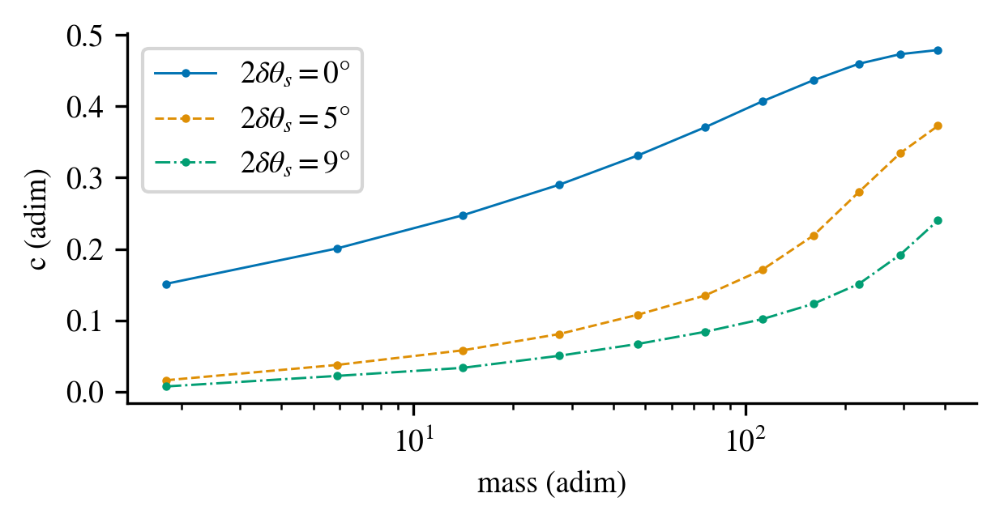

In [ ]:
from matplotlib.rcsetup import cycler

fig, ax = plt.subplots(figsize=(4, 2), constrained_layout=True)
sns.set_palette("colorblind")
ls_cycle = cycler(linestyle=["-", "--", "-.", ":"])
color_cycler = cycler(color=sns.color_palette("colorblind", n_colors=len(ls_cycle)))
ax.set_prop_cycle(ls_cycle + color_cycler)
for dθₛ, sdf in vel_df.groupby("dθₛ"):
    sdf.plot(
        x="mass",
        y="c",
        label=f"$2\\delta\\theta_s={dθₛ}°$",
        ax=ax,
        marker=".",
        linewidth=0.7,
        markersize=3,
    )
ax.set_xlabel("mass (adim)")
ax.set_ylabel("c (adim)")
ax.set_xscale("log")
sns.despine()

fig.savefig(
    f"../reports/figures/fig-11.dropsize_vel.pdf",
    dpi=300,
    bbox_inches="tight",
)

In [ ]:
import pandas as pd

L = 24 * 3
df = pd.read_csv("../data/outputs/bench_timestep.csv")
df["dx"] = (df["n"] - 1) / L

In [ ]:
from scipy.optimize import curve_fit


# dt = a dx^2
def theorical_fit(dx, a, n):
    dt = a * dx**n
    return dt

In [ ]:
(a, n), _ = curve_fit(theorical_fit, df.dx, df.dt, p0=(1, 1), maxfev=10000)
th_dx = np.linspace(df.dx.min(), df.dx.max(), 100)
th_dt = theorical_fit(th_dx, a, n)

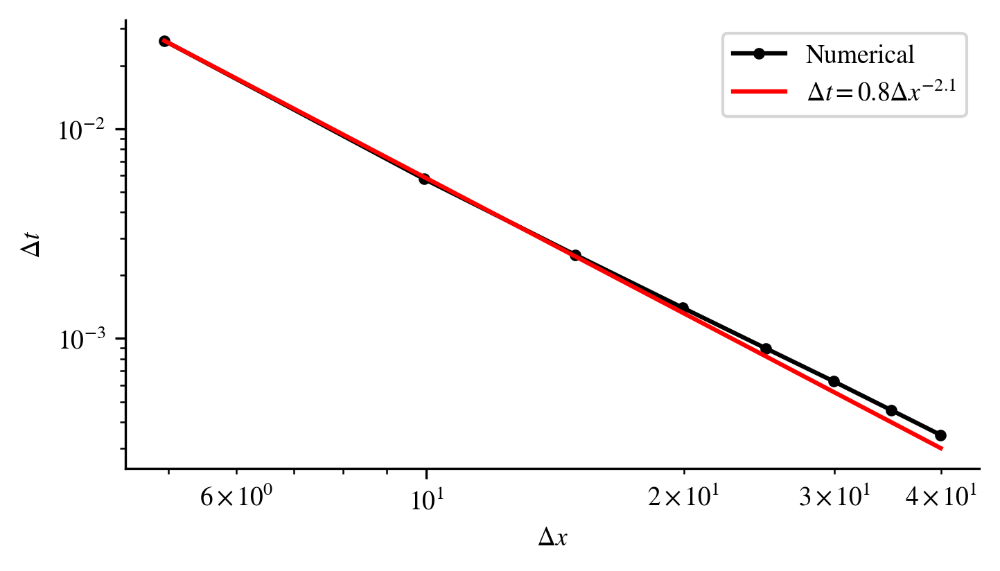

In [ ]:
fig, ax = plt.subplots(figsize=(5.3, 2.8))

ax.plot("dx", "dt", data=df, marker=".", color="k", label="Numerical")
ax.plot(
    th_dx,
    th_dt,
    color="r",
    alpha=1,
    label=r"$\Delta t = %.1f \Delta x^{%.1f}$" % (a, n),
)
ax.set_xlabel(r"$\Delta x$")
ax.set_ylabel(r"$\Delta t$")
ax.set_xscale("log")
ax.set_yscale("log")
ax.legend()
sns.despine()
fig.savefig("../reports/figures/supp_bench_timestep.pdf", bbox_inches="tight")